<a href="https://colab.research.google.com/github/akashnachane05/MechAInic/blob/main/ai_try.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# MVTech 2D Model

In [ ]:
# My Notebook Title

import urllib.request
urllib.request.urlretrieve("https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420937484-1629951672/hazlenut.tar.xz",
                           "carpet.tar.xz")

import tarfile

with tarfile.open('carpet.tar.xz') as f:
    f.extractall('.')


# "bottle": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420937370-1629951468/bottle.tar.xz",
# "cable": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420937413-1629951498/cable.tar.xz",
# "capsule": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420937454-1629951595/capsule.tar.xz",
# "carpet": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420937484-1629951672/carpet.tar.xz",
# "grid": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420937487-1629951814/grid.tar.xz",
# "hazelnut": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420937545-1629951845/hazelnut.tar.xz",
# "leather": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420937607-1629951964/leather.tar.xz",
# "metal_nut": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420937637-1629952063/metal_nut.tar.xz",
# "pill": "https://www.mydrive.ch/shares/43421/11a215a5749fcfb75e331ddd5f8e43ee/download/420938129-1629953099/pill.tar.xz",
# "screw": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420938130-1629953152/screw.tar.xz",
# "tile": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420938133-1629953189/tile.tar.xz",
# "toothbrush": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420938134-1629953256/toothbrush.tar.xz",
# "transistor": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420938166-1629953277/transistor.tar.xz",
# "wood": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420938383-1629953354/wood.tar.xz",
# "zipper": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420938385-1629953449/zipper.tar.xz"


In [ ]:
from pathlib import Path
import numpy as np
import os, shutil
import matplotlib.pyplot as plt

from PIL import Image

from tqdm.auto import tqdm

import torch
import torchvision
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision.transforms import transforms
import torch.optim as optim
import torch.nn as nn
from torchvision.models import resnet50, ResNet50_Weights

In [ ]:
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor()
])

train_image_path = Path('/content/carpet/train')

good_dataset = ImageFolder(root=train_image_path, transform=transform)
train_dataset, test_dataset = torch.utils.data.random_split(good_dataset, [0.8, 0.2])

# Set the batch size
BS = 16

# Create data loaders for training and testing datasets
train_loader = DataLoader(train_dataset, batch_size=BS, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=BS, shuffle=True)

In [ ]:
resnet_model = resnet50(weights=ResNet50_Weights.DEFAULT)

# for name in resnet_model.named_parameters():
#     print(name[0])

resnet_model.layer2

def hook(model, input, output):
    feature.append(output.detach())

feature =[]
resnet_model.layer2[-1].register_forward_hook(hook)
resnet_model.layer3[-1].register_forward_hook(hook)

_ = resnet_model(torch.randn(1,3,224,224))

# feature[1].shape

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 164MB/s]


In [ ]:
class resnet_feature_extractor(torch.nn.Module):
    def __init__(self):
        """This class extracts the feature maps from a pretrained Resnet model."""
        super(resnet_feature_extractor, self).__init__()
        self.model = resnet50(weights=ResNet50_Weights.DEFAULT)

        self.model.eval()
        for param in self.model.parameters():
            param.requires_grad = False



        # Hook to extract feature maps
        def hook(module, input, output) -> None:
            """This hook saves the extracted feature map on self.featured."""
            self.features.append(output)

        self.model.layer2[-1].register_forward_hook(hook)
        self.model.layer3[-1].register_forward_hook(hook)

    def forward(self, input):

        self.features = []
        with torch.no_grad():
            _ = self.model(input)

        self.avg = torch.nn.AvgPool2d(3, stride=1)
        fmap_size = self.features[0].shape[-2]         # Feature map sizes h, w
        self.resize = torch.nn.AdaptiveAvgPool2d(fmap_size)

        resized_maps = [self.resize(self.avg(fmap)) for fmap in self.features]
        patch = torch.cat(resized_maps, 1)            # Merge the resized feature maps

        return patch

torch.Size([1, 512, 28, 28])
torch.Size([1, 1024, 14, 14])
torch.Size([1, 1536, 28, 28])


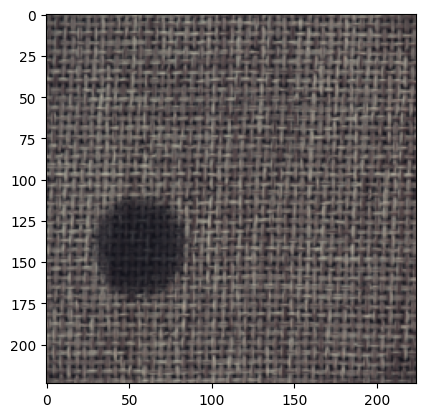

In [ ]:
image = Image.open(r'/content/carpet/test/color/000.png')
image = transform(image).unsqueeze(0)

backbone = resnet_feature_extractor()
feature = backbone(image)

print(backbone.features[0].shape)
print(backbone.features[1].shape)

print(feature.shape)

plt.imshow(image[0].permute(1,2,0))

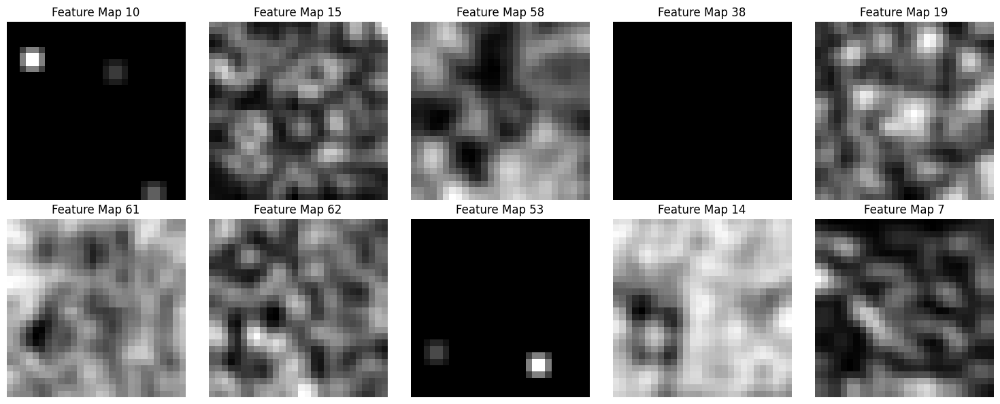

In [ ]:
# Select 10 random indices for feature maps
indices = torch.randperm(64)[:10]

# Plot the selected feature maps
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
for i, idx in enumerate(indices):
    row = i // 5
    col = i % 5
    axes[row, col].imshow(feature[0,idx].detach().cpu(), cmap='gray')
    axes[row, col].set_title(f'Feature Map {idx}')
    axes[row, col].axis('off')
plt.tight_layout()
plt.show()

In [ ]:
import torch.nn as nn

class FeatCAE(nn.Module):
    """Autoencoder."""

    def __init__(self, in_channels=1000, latent_dim=50, is_bn=True):
        super(FeatCAE, self).__init__()

        layers = []
        layers += [nn.Conv2d(in_channels, (in_channels + 2 * latent_dim) // 2, kernel_size=1, stride=1, padding=0)]
        if is_bn:
            layers += [nn.BatchNorm2d(num_features=(in_channels + 2 * latent_dim) // 2)]
        layers += [nn.ReLU()]
        layers += [nn.Conv2d((in_channels + 2 * latent_dim) // 2, 2 * latent_dim, kernel_size=1, stride=1, padding=0)]
        if is_bn:
            layers += [nn.BatchNorm2d(num_features=2 * latent_dim)]
        layers += [nn.ReLU()]
        layers += [nn.Conv2d(2 * latent_dim, latent_dim, kernel_size=1, stride=1, padding=0)]

        self.encoder = nn.Sequential(*layers)

        # if 1x1 conv to reconstruct the rgb values, we try to learn a linear combination
        # of the features for rgb
        layers = []
        layers += [nn.Conv2d(latent_dim, 2 * latent_dim, kernel_size=1, stride=1, padding=0)]
        if is_bn:
            layers += [nn.BatchNorm2d(num_features=2 * latent_dim)]
        layers += [nn.ReLU()]
        layers += [nn.Conv2d(2 * latent_dim, (in_channels + 2 * latent_dim) // 2, kernel_size=1, stride=1, padding=0)]
        if is_bn:
            layers += [nn.BatchNorm2d(num_features=(in_channels + 2 * latent_dim) // 2)]
        layers += [nn.ReLU()]
        layers += [nn.Conv2d((in_channels + 2 * latent_dim) // 2, in_channels, kernel_size=1, stride=1, padding=0)]
        # layers += [nn.ReLU()]

        self.decoder = nn.Sequential(*layers)

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

In [ ]:
model = FeatCAE(in_channels=1536, latent_dim=100).cuda()
backbone.cuda()
# Define loss function and optimizer
criterion = torch.nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [1/50], Loss: 0.0886, Validation Loss: 0.2553
Epoch [6/50], Loss: 0.0227, Validation Loss: 0.0238
Epoch [11/50], Loss: 0.0197, Validation Loss: 0.0200
Epoch [16/50], Loss: 0.0173, Validation Loss: 0.0170
Epoch [21/50], Loss: 0.0147, Validation Loss: 0.0146
Epoch [26/50], Loss: 0.0135, Validation Loss: 0.0132
Epoch [31/50], Loss: 0.0120, Validation Loss: 0.0120
Epoch [36/50], Loss: 0.0108, Validation Loss: 0.0113
Epoch [41/50], Loss: 0.0101, Validation Loss: 0.0104
Epoch [46/50], Loss: 0.0103, Validation Loss: 0.0101


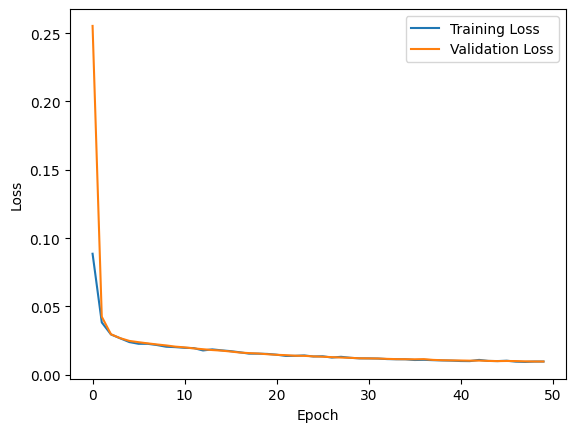

In [ ]:
# Define a list to store training loss and validation loss
Loss = []
Validation_Loss = []


num_epochs = 50
for epoch in tqdm(range(num_epochs)):
    model.train()
    for data,_ in train_loader:
        with torch.no_grad():
            features = backbone(data.cuda())
        # Forward pass
        output = model(features)
        # Compute the loss
        loss = criterion(output, features)
        # Backpropagation and optimization step
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    Loss.append(loss.item())

    # Calculate validation loss
    model.eval()  # Set model to evaluation mode
    with torch.no_grad():
        val_loss_sum = 0.0
        num_batches = 0
        for data, _ in test_loader:
            features = backbone(data.cuda())
            output = model(features)
            val_loss = criterion(output, features)
            val_loss_sum += val_loss.item()
            num_batches += 1
        val_loss_avg = val_loss_sum / num_batches
        Validation_Loss.append(val_loss_avg)

    if epoch % 5 == 0:
        print('Epoch [{}/{}], Loss: {:.4f}, Validation Loss: {:.4f}'.format(epoch + 1, num_epochs, loss.item(), val_loss_avg))

plt.plot(Loss, label='Training Loss')
plt.plot(Validation_Loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
torch.save(model.state_dict(), '/content/mvtech2d.pth')

In [ ]:
ckpoints = torch.load('/content/mvtech2d.pth')
model.load_state_dict(ckpoints)

model.eval()

FeatCAE(
  (encoder): Sequential(
    (0): Conv2d(1536, 868, kernel_size=(1, 1), stride=(1, 1))
    (1): BatchNorm2d(868, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(868, 200, kernel_size=(1, 1), stride=(1, 1))
    (4): BatchNorm2d(200, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): Conv2d(200, 100, kernel_size=(1, 1), stride=(1, 1))
  )
  (decoder): Sequential(
    (0): Conv2d(100, 200, kernel_size=(1, 1), stride=(1, 1))
    (1): BatchNorm2d(200, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(200, 868, kernel_size=(1, 1), stride=(1, 1))
    (4): BatchNorm2d(868, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): Conv2d(868, 1536, kernel_size=(1, 1), stride=(1, 1))
  )
)

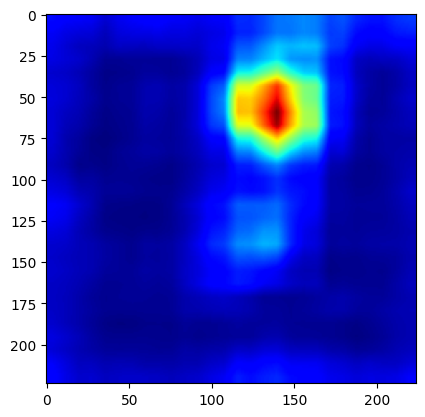

In [ ]:
image = Image.open(r'/content/carpet/test/hole/002.png')
image = transform(image).unsqueeze(0)

with torch.no_grad():
    features = backbone(image.cuda())
    recon = model(features)

recon_error =  ((features-recon)**2).mean(axis=(1)).unsqueeze(0)

segm_map = torch.nn.functional.interpolate(     # Upscale by bi-linaer interpolation to match the original input resolution
                recon_error,
                size=(224, 224),
                mode='bilinear'
            )

plt.imshow(segm_map.squeeze().cpu().numpy(), cmap='jet')
plt.show()

In [ ]:
def decision_function(segm_map):

    mean_top_10_values = []

    for map in segm_map:
        # Flatten the tensor
        flattened_tensor = map.reshape(-1)

        # Sort the flattened tensor along the feature dimension (descending order)
        sorted_tensor, _ = torch.sort(flattened_tensor,descending=True)

        # Take the top 10 values along the feature dimension
        mean_top_10_value = sorted_tensor[:10].mean()

        mean_top_10_values.append(mean_top_10_value)

    return torch.stack(mean_top_10_values)

In [ ]:
model.eval()

RECON_ERROR=[]
for data,_ in train_loader:

    with torch.no_grad():
        features = backbone(data.cuda()).squeeze()
        # Forward pass
        recon = model(features)
    # Compute the loss
    segm_map =  ((features-recon)**2).mean(axis=(1))[:,3:-3,3:-3]
    anomaly_score = decision_function(segm_map)
    # anomaly_score = segm_map.mean(axis=(1,2))

    RECON_ERROR.append(anomaly_score)

RECON_ERROR = torch.cat(RECON_ERROR).cpu().numpy()

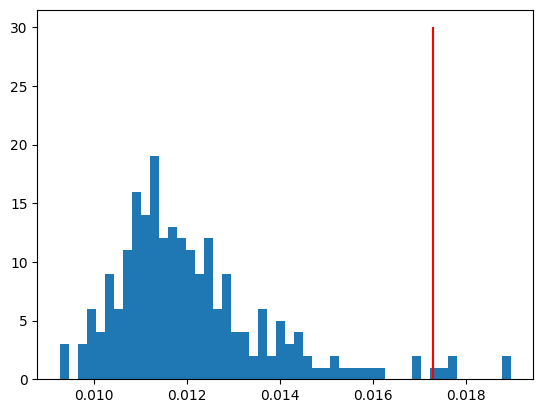

In [ ]:
best_threshold = np.mean(RECON_ERROR) + 3 * np.std(RECON_ERROR)

heat_map_max, heat_map_min = np.max(RECON_ERROR), np.min(RECON_ERROR)

plt.hist(RECON_ERROR,bins=50)
plt.vlines(x=best_threshold,ymin=0,ymax=30,color='r')
plt.show()

In [ ]:
y_true=[]
y_pred=[]
y_score=[]

model.eval()
backbone.eval()

test_path = Path('carpet/test')

for path in test_path.glob('*/*.png'):
    fault_type = path.parts[-2]
    test_image = transform(Image.open(path)).cuda().unsqueeze(0)

    with torch.no_grad():
        features = backbone(test_image)
        # Forward pass
        recon = model(features)

    segm_map = ((features - recon)**2).mean(axis=(1))[:,3:-3,3:-3]
    y_score_image = decision_function(segm_map=segm_map)
    # y_score_image = segm_map.mean(axis=(1,2))

    y_pred_image = 1*(y_score_image >= best_threshold)

    y_true_image = 0 if fault_type == 'good' else 1

    y_true.append(y_true_image)
    y_pred.append(y_pred_image.cpu().numpy())
    y_score.append(y_score_image.cpu().numpy())

y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_score = np.array(y_score)

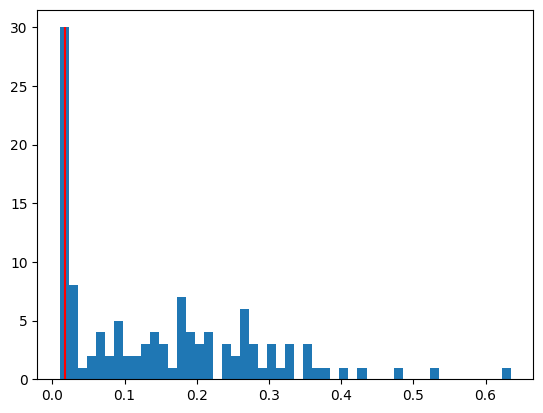

In [ ]:
plt.hist(y_score,bins=50)
plt.vlines(x=best_threshold,ymin=0,ymax=30,color='r')
plt.show()

AUC-ROC Score: 0.9835473515248796


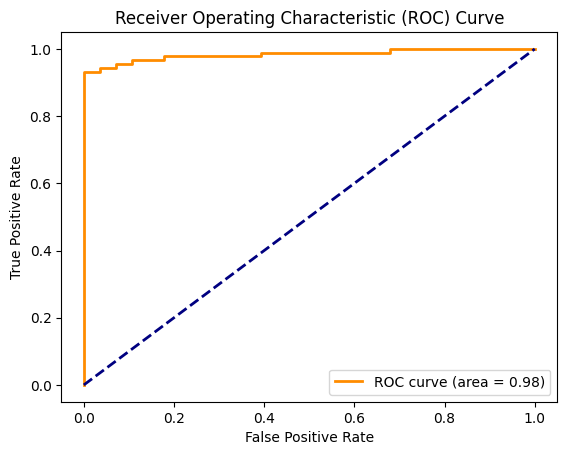

best_threshold = 0.022323638200759888


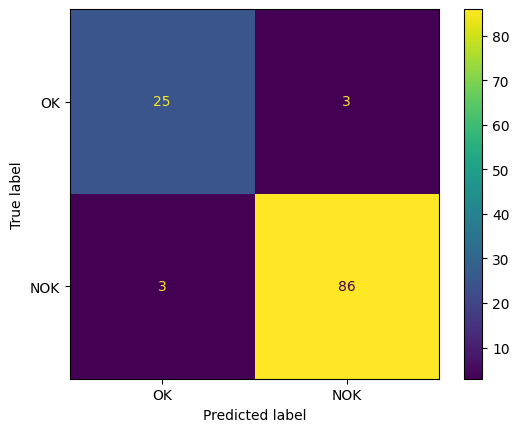

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, roc_curve, confusion_matrix, ConfusionMatrixDisplay, f1_score
import seaborn as sns



# Calculate AUC-ROC score
auc_roc_score = roc_auc_score(y_true, y_score)
print("AUC-ROC Score:", auc_roc_score)

# Plot ROC curve
fpr, tpr, thresholds = roc_curve(y_true, y_score)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % auc_roc_score)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()



f1_scores = [f1_score(y_true, y_score >= threshold) for threshold in thresholds]

# Select the best threshold based on F1 score
best_threshold = thresholds[np.argmax(f1_scores)]

print(f'best_threshold = {best_threshold}')

# Generate confusion matrix
cm = confusion_matrix(y_true, (y_score >= best_threshold).astype(int))
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=['OK','NOK'])
disp.plot()
plt.show()

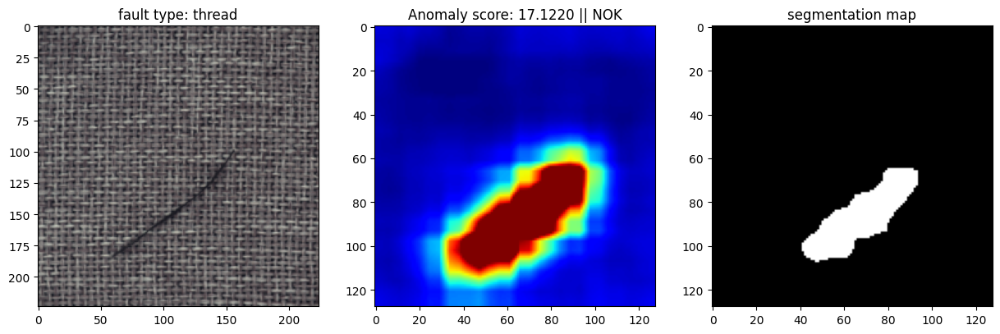

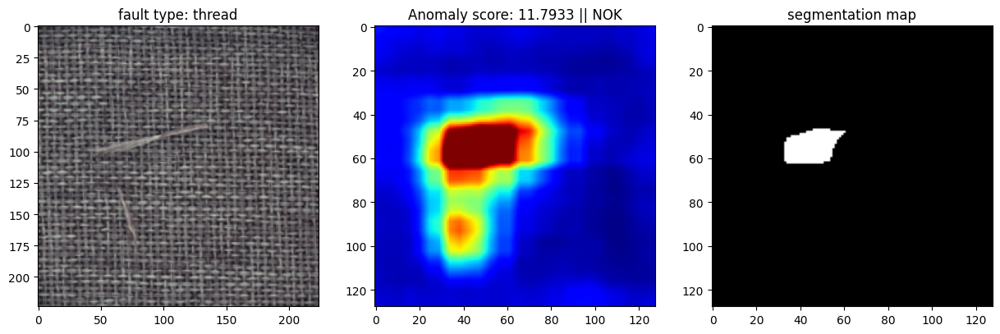

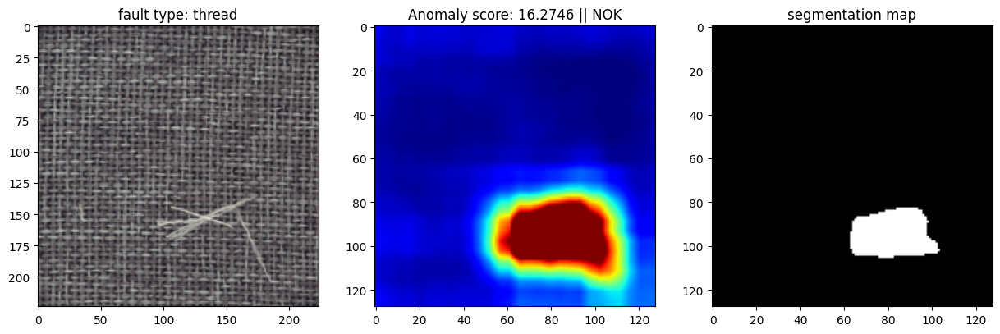

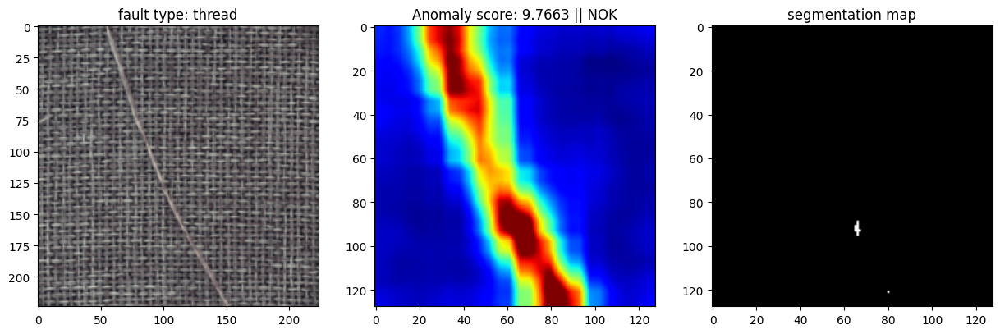

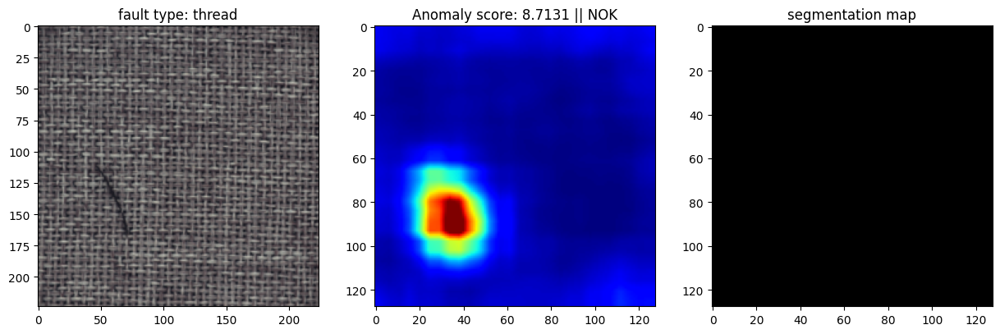

...

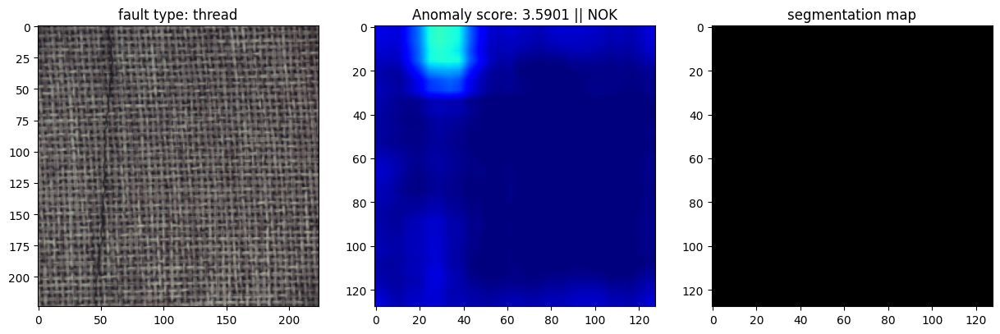

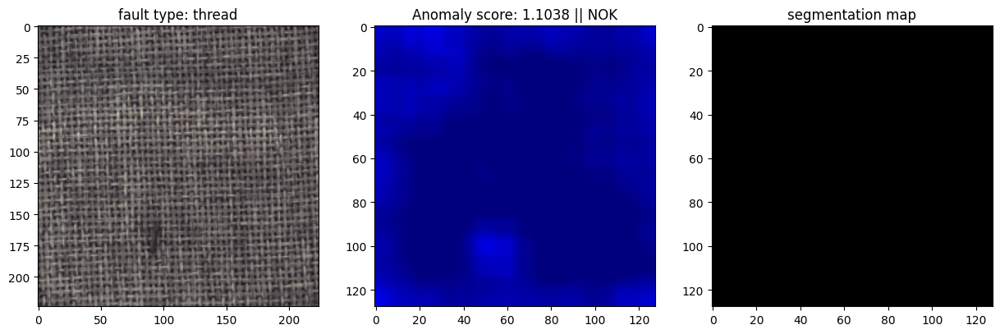

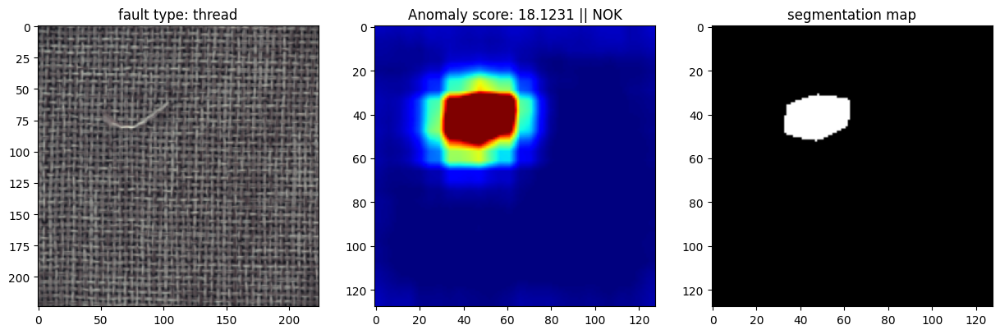

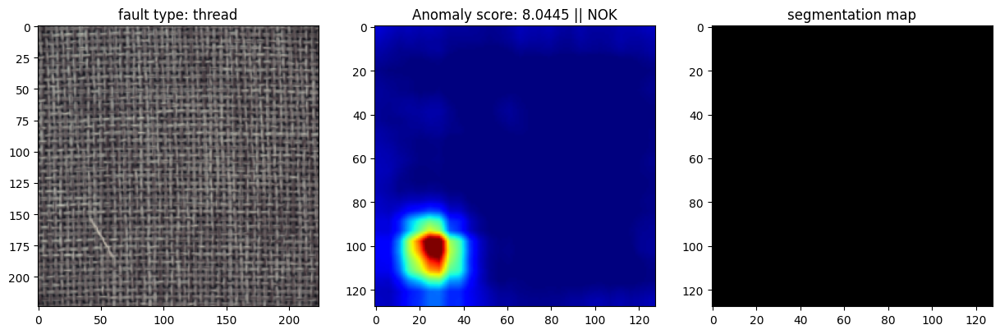

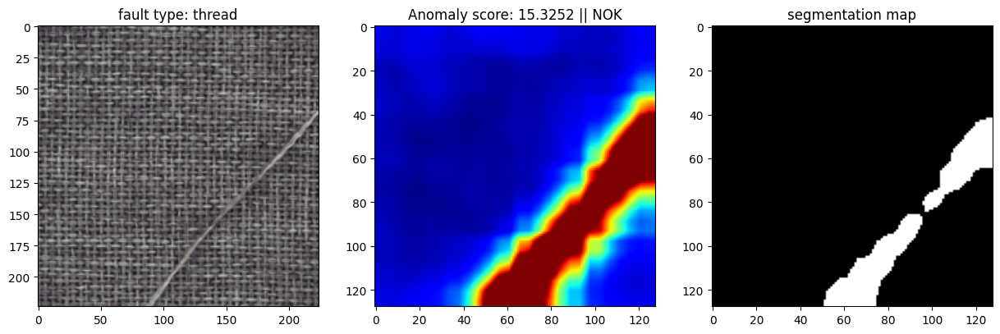

In [ ]:
import cv2, time
from IPython.display import clear_output

model.eval()
backbone.eval()

test_path = Path('carpet/test')

for path in test_path.glob('*/*.png'):
    fault_type = path.parts[-2]
    test_image = transform(Image.open(path)).cuda().unsqueeze(0)

    with torch.no_grad():
        features = backbone(test_image)
        # Forward pass
        recon = model(features)

    segm_map = ((features - recon)**2).mean(axis=(1))
    y_score_image = decision_function(segm_map=segm_map)
    # y_score_image = segm_map.mean(axis=(1,2))

    y_pred_image = 1*(y_score_image >= best_threshold)
    class_label = ['OK','NOK']

    if fault_type in ['thread']:

        plt.figure(figsize=(15,5))

        plt.subplot(1,3,1)
        plt.imshow(test_image.squeeze().permute(1,2,0).cpu().numpy())
        plt.title(f'fault type: {fault_type}')

        plt.subplot(1,3,2)
        heat_map = segm_map.squeeze().cpu().numpy()
        heat_map = heat_map
        heat_map = cv2.resize(heat_map, (128,128))
        plt.imshow(heat_map, cmap='jet', vmin=heat_map_min, vmax=heat_map_max*10) # Here I am cheating by multiplying by 10 (obtained using trail error)
        plt.title(f'Anomaly score: {y_score_image[0].cpu().numpy() / best_threshold:0.4f} || {class_label[y_pred_image]}')

        plt.subplot(1,3,3)
        plt.imshow((heat_map > best_threshold * 10), cmap='gray')
        plt.title(f'segmentation map')

        plt.show()

In [ ]:
!pip install torchviz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 122.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 99.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 62.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 103.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitl

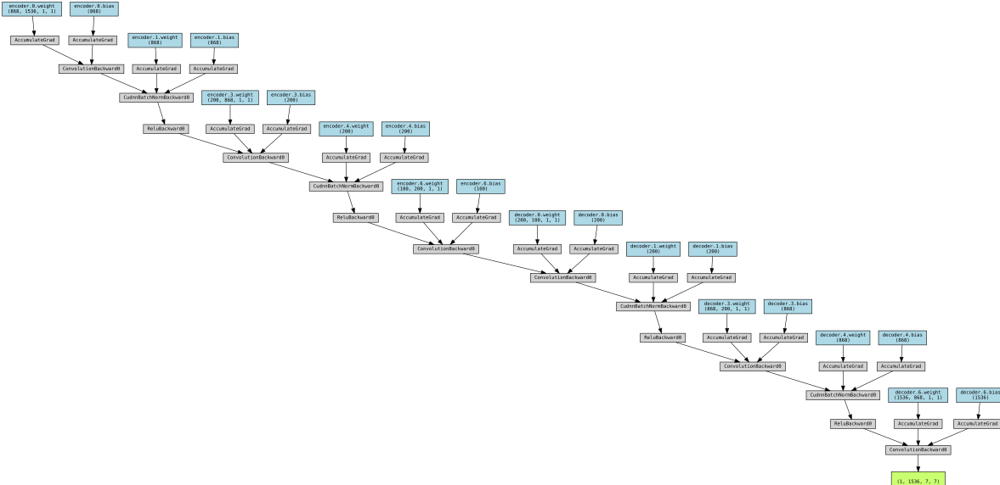

In [ ]:
# prompt: write a function to load model and visualise model architecture without input tensors

from torchviz import make_dot

def load_and_visualize_model(model_path):
  """Loads a model and visualizes its architecture without input tensors.

  Args:
    model_path: Path to the saved model file.
  """

  # Assuming you have a model class defined (e.g., FeatCAE)
  model = FeatCAE(in_channels=1536, latent_dim=100).cuda()
  model.load_state_dict(torch.load(model_path))
  model.eval()

  # Create a dummy input (you can adjust the size if needed)
  x = torch.randn(1, 1536, 7, 7).cuda()

  # Generate the visualization
  dot = make_dot(model(x), params=dict(model.named_parameters()))

  # Display the visualization
  dot.render("model_architecture", format="png")  # Save as PNG
  return dot



# Example usage:
# Replace 'path/to/your/model.pth' with your model file path
dot = load_and_visualize_model('/content/mvtech2d.pth')
dot

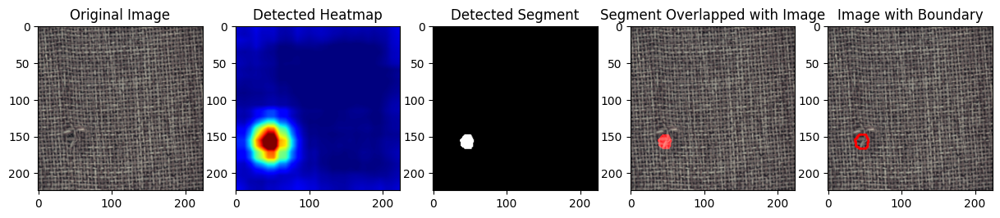

In [ ]:
# Load the model
model = FeatCAE(in_channels=1536, latent_dim=100).cuda()
model.load_state_dict(torch.load("/content/mvtech2d.pth"))
model.eval()

# Load the feature extractor
backbone = resnet_feature_extractor().cuda()
backbone.eval()

best_threshold = 0.019037378951907158

def detect_and_visualize(model, backbone, image_path, best_threshold, heat_map_max, heat_map_min):
  """
  Performs anomaly detection on a single image and visualizes the results.

  Args:
    model: The trained autoencoder model.
    backbone: The feature extraction backbone.
    image_path: Path to the input image.
    best_threshold: The threshold for anomaly detection.
    heat_map_max: The maximum value for the heatmap.
    heat_map_min: The minimum value for the heatmap.

  Returns:
    None
  """

  model.eval()
  backbone.eval()

  test_image = transform(Image.open(image_path)).cuda().unsqueeze(0)

  with torch.no_grad():
    features = backbone(test_image)
    recon = model(features)

  segm_map = ((features - recon) ** 2).mean(axis=(1))
  y_score_image = decision_function(segm_map=segm_map)
  y_pred_image = 1 * (y_score_image >= best_threshold)
  class_label = ['OK', 'NOK']


  plt.figure(figsize=(15, 5))

  plt.subplot(1, 5, 1)
  plt.imshow(test_image.squeeze().permute(1, 2, 0).cpu().numpy())
  plt.title('Original Image')

  plt.subplot(1, 5, 2)
  heat_map = segm_map.squeeze().cpu().numpy()
  heat_map = cv2.resize(heat_map, (224, 224))
  plt.imshow(heat_map, cmap='jet', vmin=heat_map_min, vmax=heat_map_max * 10)
  plt.title('Detected Heatmap')

  plt.subplot(1, 5, 3)
  plt.imshow((heat_map > best_threshold * 10), cmap='gray')
  plt.title('Detected Segment')

  plt.subplot(1, 5, 4)
  overlay = test_image.squeeze().permute(1, 2, 0).cpu().numpy().copy()
  overlay[..., 0] = np.where((heat_map > best_threshold * 10), 255, overlay[..., 0])
  plt.imshow(overlay)
  plt.title('Segment Overlapped with Image')

  plt.subplot(1, 5, 5)
  contours, _ = cv2.findContours((heat_map > best_threshold * 10).astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  img_with_boundary = test_image.squeeze().permute(1, 2, 0).cpu().numpy().copy()
  cv2.drawContours(img_with_boundary, contours, -1, (255, 0, 0), 2)
  plt.imshow(img_with_boundary)
  plt.title('Image with Boundary')


  plt.show()

# Example usage:
# Replace 'path/to/your/image.png' with your image path
detect_and_visualize(model, backbone, '/content/carpet/test/hole/005.png', best_threshold, heat_map_max, heat_map_min)

In [ ]:
from pathlib import Path
import numpy as np
import os, shutil
import matplotlib.pyplot as plt
import cv2
from PIL import Image

from tqdm.auto import tqdm

import torch
import torchvision
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision.transforms import transforms
import torch.optim as optim
import torch.nn as nn
from torchvision.models import resnet50, ResNet50_Weights

In [ ]:
# This cell contains all the model definitions

#ResNet
resnet_model = resnet50(weights=ResNet50_Weights.DEFAULT)

# for name in resnet_model.named_parameters():
#     print(name[0])

resnet_model.layer2

def hook(model, input, output):
    feature.append(output.detach())

feature =[]
resnet_model.layer2[-1].register_forward_hook(hook)
resnet_model.layer3[-1].register_forward_hook(hook)

_ = resnet_model(torch.randn(1,3,224,224))

# ResNet feature extractor
class resnet_feature_extractor(torch.nn.Module):
    def __init__(self):
        """This class extracts the feature maps from a pretrained Resnet model."""
        super(resnet_feature_extractor, self).__init__()
        self.model = resnet50(weights=ResNet50_Weights.DEFAULT)

        self.model.eval()
        for param in self.model.parameters():
            param.requires_grad = False



        # Hook to extract feature maps
        def hook(module, input, output) -> None:
            """This hook saves the extracted feature map on self.featured."""
            self.features.append(output)

        self.model.layer2[-1].register_forward_hook(hook)
        self.model.layer3[-1].register_forward_hook(hook)

    def forward(self, input):

        self.features = []
        with torch.no_grad():
            _ = self.model(input)

        self.avg = torch.nn.AvgPool2d(3, stride=1)
        fmap_size = self.features[0].shape[-2]         # Feature map sizes h, w
        self.resize = torch.nn.AdaptiveAvgPool2d(fmap_size)

        resized_maps = [self.resize(self.avg(fmap)) for fmap in self.features]
        patch = torch.cat(resized_maps, 1)            # Merge the resized feature maps

        return patch

# Auto Encoder Model
class FeatCAE(nn.Module):
    """Autoencoder."""

    def __init__(self, in_channels=1000, latent_dim=50, is_bn=True):
        super(FeatCAE, self).__init__()

        layers = []
        layers += [nn.Conv2d(in_channels, (in_channels + 2 * latent_dim) // 2, kernel_size=1, stride=1, padding=0)]
        if is_bn:
            layers += [nn.BatchNorm2d(num_features=(in_channels + 2 * latent_dim) // 2)]
        layers += [nn.ReLU()]
        layers += [nn.Conv2d((in_channels + 2 * latent_dim) // 2, 2 * latent_dim, kernel_size=1, stride=1, padding=0)]
        if is_bn:
            layers += [nn.BatchNorm2d(num_features=2 * latent_dim)]
        layers += [nn.ReLU()]
        layers += [nn.Conv2d(2 * latent_dim, latent_dim, kernel_size=1, stride=1, padding=0)]

        self.encoder = nn.Sequential(*layers)

        # if 1x1 conv to reconstruct the rgb values, we try to learn a linear combination
        # of the features for rgb
        layers = []
        layers += [nn.Conv2d(latent_dim, 2 * latent_dim, kernel_size=1, stride=1, padding=0)]
        if is_bn:
            layers += [nn.BatchNorm2d(num_features=2 * latent_dim)]
        layers += [nn.ReLU()]
        layers += [nn.Conv2d(2 * latent_dim, (in_channels + 2 * latent_dim) // 2, kernel_size=1, stride=1, padding=0)]
        if is_bn:
            layers += [nn.BatchNorm2d(num_features=(in_channels + 2 * latent_dim) // 2)]
        layers += [nn.ReLU()]
        layers += [nn.Conv2d((in_channels + 2 * latent_dim) // 2, in_channels, kernel_size=1, stride=1, padding=0)]
        # layers += [nn.ReLU()]

        self.decoder = nn.Sequential(*layers)

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

best_threshold = 0.019037378951907158

In [ ]:
def detect_anomaly(image_path, model_path, best_threshold):
    """
    Performs anomaly detection on a carpet image and visualizes the results.

    Args:
        image_path: Path to the carpet image.
        model_path: Path to the saved model file (.pth).
        best_threshold: Threshold for anomaly detection.

    Returns:
        A dictionary containing detection results and displays the visualization.
    """
    # Load the model
    model = FeatCAE(in_channels=1536, latent_dim=100).cuda()
    model.load_state_dict(torch.load(model_path))
    model.eval()

    # Load the feature extractor
    backbone = resnet_feature_extractor().cuda()
    backbone.eval()

    # Preprocess the image
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Lambda(lambda x: x[:3, :, :])
    ])

    # Load and store original image for visualization
    original_image = Image.open(image_path).convert('RGB')
    original_image_resized = original_image.resize((224, 224))
    original_np = np.array(original_image_resized)

    image = transform(original_image).unsqueeze(0).cuda()

    # Perform inference
    with torch.no_grad():
        features = backbone(image)
        recon = model(features)

    # Calculate anomaly score and heatmap
    segm_map = ((features - recon) ** 2).mean(axis=(1))

    def decision_function(segm_map):
        mean_top_10_values = []
        for map in segm_map:
            flattened_tensor = map.reshape(-1)
            sorted_tensor, _ = torch.sort(flattened_tensor, descending=True)
            mean_top_10_value = sorted_tensor[:10].mean()
            mean_top_10_values.append(mean_top_10_value)
        return torch.stack(mean_top_10_values)

    anomaly_score = decision_function(segm_map=segm_map).cpu().numpy()[0]
    heatmap = segm_map.squeeze().cpu().numpy()
    heatmap = cv2.resize(heatmap, (224, 224))

    # Normalize heatmap to [0, 1]
    normalized_heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min())

    # Create binary mask using Otsu's thresholding
    heatmap_uint8 = (normalized_heatmap * 255).astype(np.uint8)
    _, binary_mask = cv2.threshold(heatmap_uint8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    binary_mask = binary_mask.astype(np.uint8)

    # Apply morphological operations to clean up the mask
    kernel = np.ones((3,3), np.uint8)
    binary_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_OPEN, kernel)
    binary_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, kernel)

    # Create colored heatmap
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * normalized_heatmap), cv2.COLORMAP_JET)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)

    # Create overlapped images
    alpha = 0.7
    heatmap_overlap = cv2.addWeighted(original_np, 1 - alpha, heatmap_colored, alpha, 0)

    # Create segmentation overlap
    segment_overlap = original_np.copy()
    mask_3channel = cv2.cvtColor(binary_mask, cv2.COLOR_GRAY2RGB)
    red_mask = np.zeros_like(mask_3channel)
    red_mask[..., 0] = 255  # Red channel
    segment_overlap = np.where(mask_3channel == 255,
                             cv2.addWeighted(segment_overlap, 0.7, red_mask, 0.3, 0),
                             segment_overlap)

    # Visualization
    plt.figure(figsize=(20, 4))

    # Original Image
    plt.subplot(151)
    plt.imshow(original_np)
    plt.title('Original Image')
    plt.axis('off')

    # Heatmap
    plt.subplot(152)
    plt.imshow(normalized_heatmap, cmap='jet')
    plt.title('Detected Heatmap')
    plt.axis('off')

    # Binary Mask
    plt.subplot(153)
    plt.imshow(binary_mask, cmap='gray')
    plt.title('Segmentation Mask')
    plt.axis('off')

    # Heatmap Overlap
    plt.subplot(154)
    plt.imshow(heatmap_overlap)
    plt.title('Heatmap Overlap')
    plt.axis('off')

    # Segment Overlap
    plt.subplot(155)
    plt.imshow(segment_overlap)
    plt.title('Segment Overlap')
    plt.axis('off')

    plt.suptitle(f'Anomaly Score: {anomaly_score:.4f}, Prediction: {"Defect" if anomaly_score >= best_threshold else "Normal"}')
    plt.tight_layout()
    plt.show()

    # Make prediction
    prediction = 1 if anomaly_score >= best_threshold else 0

    return {
        'anomaly_score': anomaly_score,
        'heatmap': normalized_heatmap,
        'binary_mask': binary_mask,
        'prediction': prediction,
        'heatmap_colored': heatmap_colored,
        'heatmap_overlap': heatmap_overlap,
        'segment_overlap': segment_overlap
    }

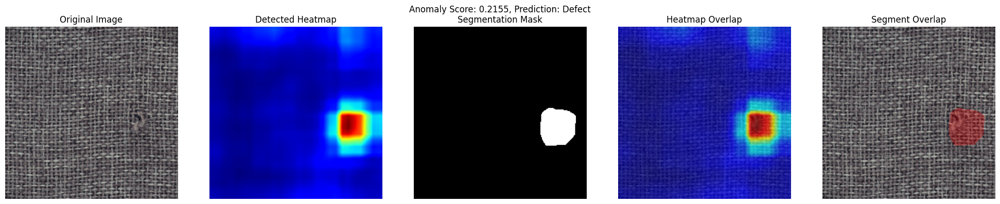

In [ ]:
results = detect_anomaly(
    image_path='/content/carpet/test/hole/004.png',
    model_path='/content/mvtech2d.pth',
    best_threshold=best_threshold
)

# Multi-Class Classification

In [ ]:
# Ensure required libraries are installed
!pip install -q timm requests scikit-learn opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 26.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 49.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 19.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 108.9 MB/s eta 0:00:00


In [ ]:
# @title Setup: Install Libraries and Import Modules



import os
import tarfile
import requests
from tqdm.notebook import tqdm
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torchvision.models as models
from sklearn.metrics import roc_auc_score, roc_curve, precision_recall_curve
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import timm
import gc # Garbage collector
import cv2 # For visualization

# Check GPU availability and print info
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"Device count: {torch.cuda.device_count()}")
    print(f"Current device: {torch.cuda.current_device()}")
    print(f"Device name: {torch.cuda.get_device_name(torch.cuda.current_device())}")
    device = torch.device("cuda")
else:
    print("CUDA not available, using CPU.")
    device = torch.device("cpu")

PyTorch version: 2.6.0+cu124
CUDA available: True
Device count: 1
Current device: 0
Device name: Tesla T4


In [ ]:
# @title Configuration

# @markdown ### Dataset Configuration
DATASET_NAME = 'mvtec_ad'
# @markdown Select multiple classes from MVTec AD (e.g., ['bottle', 'transistor', 'cable', 'pill'])
SELECTED_CLASSES_STR = "['bottle', 'transistor', 'cable', 'pill']" # @param {type:"string"}
# Convert string list to Python list
SELECTED_CLASSES = [c.strip() for c in SELECTED_CLASSES_STR.strip("[]").replace("'", "").replace('"', '').split(',')]
DATASET_URL = "https://www.mydrive.ch/shares/38536/3830184030e49f6a0e2aea4bdb4ae774/download/420938113-1629952094/mvtec_anomaly_detection.tar.xz"
DATASET_PATH = "./"
IMAGE_SIZE = 256 # @param {type:"integer"}

# @markdown ### Model Configuration
BACKBONE_NAME = 'wide_resnet50_2' # @param {type:"string"}
# @markdown Layers to extract features from (e.g., ['layer1', 'layer2', 'layer3'])
FEATURE_LAYERS_STR = "['layer1', 'layer2', 'layer3']" # @param {type:"string"}
# Convert string list to Python list
FEATURE_LAYERS = [f.strip() for f in FEATURE_LAYERS_STR.strip("[]").replace("'", "").replace('"', '').split(',')]
LATENT_DIM = 100 # @param {type:"integer"}
USE_BATCHNORM = True # @param {type:"boolean"}

# @markdown ### Training Configuration
NUM_EPOCHS = 50 # @param {type:"integer"}
BATCH_SIZE = 16 # @param {type:"integer"}
LEARNING_RATE = 0.0001 # @param {type:"number"}
WEIGHT_DECAY = 0.00001 # @param {type:"number"}

# ------------------- Evaluation Configuration -------------------
# (Threshold will be determined automatically based on F1 score)

print("Configuration loaded.")
print(f"Selected classes: {SELECTED_CLASSES}")
print(f"Feature layers: {FEATURE_LAYERS}")

Configuration loaded.
Selected classes: ['bottle', 'transistor', 'cable', 'pill']
Feature layers: ['layer1', 'layer2', 'layer3']


In [ ]:
# @title Download and Extract Selected MVTec AD Classes

# Dictionary of MVTec AD class URLs
MVTEC_CLASS_URLS = {
    "bottle": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420937370-1629951468/bottle.tar.xz",
    "cable": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420937413-1629951498/cable.tar.xz",
    "capsule": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420937454-1629951595/capsule.tar.xz",
    "carpet": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420937484-1629951672/carpet.tar.xz",
    "grid": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420937487-1629951814/grid.tar.xz",
    "hazelnut": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420937545-1629951845/hazelnut.tar.xz",
    "leather": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420937607-1629951964/leather.tar.xz",
    "metal_nut": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420937637-1629952063/metal_nut.tar.xz",
    "pill": "https://www.mydrive.ch/shares/43421/11a215a5749fcfb75e331ddd5f8e43ee/download/420938129-1629953099/pill.tar.xz",
    "screw": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420938130-1629953152/screw.tar.xz",
    "tile": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420938133-1629953189/tile.tar.xz",
    "toothbrush": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420938134-1629953256/toothbrush.tar.xz",
    "transistor": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420938166-1629953277/transistor.tar.xz",
    "wood": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420938383-1629953354/wood.tar.xz",
    "zipper": "https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420938385-1629953449/zipper.tar.xz"
}

def download_and_extract_classes(selected_classes, download_path, extract_path, class_urls):
    """Downloads and extracts selected MVTec AD class datasets."""
    print(f"Attempting to download and extract selected classes: {selected_classes}")

    # Ensure directories exist
    os.makedirs(download_path, exist_ok=True)
    os.makedirs(extract_path, exist_ok=True)

    downloaded_count = 0
    extracted_count = 0

    for cls_name in selected_classes:
        if cls_name not in class_urls:
            print(f"Warning: URL not found for class '{cls_name}'. Skipping.")
            continue

        url = class_urls[cls_name]
        filename = f"{cls_name}.tar.xz" # Standardize filename
        download_filepath = os.path.join(download_path, filename)
        class_extract_dir = os.path.join(extract_path, cls_name) # Target directory for this class

        # Check if the class directory already exists and seems populated
        if os.path.exists(class_extract_dir) and (os.path.exists(os.path.join(class_extract_dir, 'train')) or os.path.exists(os.path.join(class_extract_dir, 'test'))):
            print(f"Class '{cls_name}' directory found at {class_extract_dir}. Skipping download and extraction.")
            extracted_count += 1
            continue

        # Download the file
        if not os.path.exists(download_filepath):
            print(f"Downloading {filename}...")
            try:
                response = requests.get(url, stream=True, timeout=60) # Increased timeout
                response.raise_for_status()
                total_size = int(response.headers.get('content-length', 0))
                block_size = 1024 * 1024 # 1 Mebibyte
                progress_bar = tqdm(total=total_size, unit='iB', unit_scale=True, desc=f"Downloading {filename}")
                with open(download_filepath, 'wb') as f:
                    for data in response.iter_content(block_size):
                        progress_bar.update(len(data))
                        f.write(data)
                progress_bar.close()
                if total_size != 0 and progress_bar.n != total_size:
                    print("ERROR: Download incomplete.")
                    if os.path.exists(download_filepath): os.remove(download_filepath)
                    continue # Skip extraction for this class
                downloaded_count += 1
            except requests.exceptions.RequestException as e:
                print(f"Error downloading {filename}: {e}")
                if os.path.exists(download_filepath): os.remove(download_filepath)
                continue # Skip extraction for this class
        else:
            print(f"{filename} already downloaded.")
            downloaded_count += 1 # Count as downloaded if file exists

        # Extract the file
        print(f"Extracting {filename} to {extract_path}...")
        try:
            with tarfile.open(download_filepath, 'r') as tar:
                # Basic security check
                def is_within_directory(directory, target):
                    abs_directory = os.path.abspath(directory)
                    abs_target = os.path.abspath(target)
                    prefix = os.path.commonprefix([abs_directory, abs_target])
                    return prefix == abs_directory

                members = tar.getmembers()
                safe_members = []
                for member in members:
                    # Check against ZipSlip
                    if not is_within_directory(extract_path, os.path.join(extract_path, member.path)):
                         print(f"Skipping potentially malicious path during extraction: {member.path}")
                         continue
                    safe_members.append(member)

                progress_bar_extract = tqdm(safe_members, total=len(safe_members), desc=f"Extracting {filename}")
                # Extract directly to extract_path. The archive structure should create
                # the correct 'cls_name/' subfolder inside extract_path.
                tar.extractall(path=extract_path, members=progress_bar_extract, numeric_owner=False)
            print(f"Extraction of {filename} complete.")
            extracted_count += 1

            # Optional: Remove archive after extraction
            # print(f"Removing {filename}...")
            # os.remove(download_filepath)

        except tarfile.TarError as e:
            print(f"Error extracting {filename}: {e}")
        except Exception as e:
            print(f"An unexpected error occurred during extraction of {filename}: {e}")


    if extracted_count == len(selected_classes):
        print(f"\nSuccessfully downloaded and extracted all {extracted_count} selected classes to {extract_path}.")
    elif extracted_count > 0:
         print(f"\nDownloaded and extracted {extracted_count}/{len(selected_classes)} selected classes to {extract_path}. Some classes failed.")
    else:
        raise RuntimeError(f"Failed to download or extract any of the selected classes: {selected_classes}. Please check URLs and permissions.")

    # The root path for the dataset is the extraction directory where class folders reside
    return extract_path


# Execute the download and extraction for selected classes
dataset_root_path = download_and_extract_classes(SELECTED_CLASSES, DATASET_PATH, DATASET_PATH, MVTEC_CLASS_URLS)

# Verify that at least the required class directories exist after the process
if dataset_root_path is None or not all(os.path.isdir(os.path.join(dataset_root_path, cls)) for cls in SELECTED_CLASSES):
    raise RuntimeError("Dataset setup failed. Required class directories were not successfully downloaded and extracted.")

Attempting to download and extract selected classes: ['bottle', 'transistor', 'cable', 'pill']
Class 'bottle' directory found at ./bottle. Skipping download and extraction.
Class 'transistor' directory found at ./transistor. Skipping download and extraction.
Class 'cable' directory found at ./cable. Skipping download and extraction.
Class 'pill' directory found at ./pill. Skipping download and extraction.

Successfully downloaded and extracted all 4 selected classes to ./.


In [ ]:
# @title MVTec AD Dataset Class and Data Loaders

class MVTecDataset(Dataset):
    """MVTec AD Dataset for PyTorch."""
    def __init__(self, root_dir, classes, transform=None, gt_transform=None, mode='train'):
        self.root_dir = root_dir
        self.classes = classes
        self.transform = transform
        self.gt_transform = gt_transform
        self.mode = mode
        self.image_paths = []
        self.gt_paths = []
        self.labels = [] # 0 for 'good', 1 for anomaly type
        self.image_types = [] # Store the specific anomaly type or 'good'
        self.class_names_list = [] # Store the class name for each image

        print(f"Loading {mode} data for classes: {classes} from {root_dir}")

        for cls_name in self.classes:
            cls_dir = os.path.join(self.root_dir, cls_name)
            if not os.path.isdir(cls_dir):
                print(f"Warning: Class directory not found: {cls_dir}. Skipping.")
                continue

            if self.mode == 'train':
                img_dir = os.path.join(cls_dir, 'train', 'good')
                if not os.path.isdir(img_dir):
                    print(f"Warning: Train good directory not found for {cls_name}. Skipping.")
                    continue
                img_files = sorted([os.path.join(img_dir, f) for f in os.listdir(img_dir) if f.lower().endswith('.png')])
                self.image_paths.extend(img_files)
                self.gt_paths.extend([None] * len(img_files))
                self.labels.extend([0] * len(img_files))
                self.image_types.extend(['good'] * len(img_files))
                self.class_names_list.extend([cls_name] * len(img_files))
            else: # 'test' mode
                test_dir = os.path.join(cls_dir, 'test')
                gt_dir = os.path.join(cls_dir, 'ground_truth')
                if not os.path.isdir(test_dir):
                    print(f"Warning: Test directory not found for {cls_name}. Skipping.")
                    continue

                subfolders = sorted([f for f in os.listdir(test_dir) if os.path.isdir(os.path.join(test_dir, f))])
                for subfolder in subfolders:
                    img_dir = os.path.join(test_dir, subfolder)
                    img_files = sorted([os.path.join(img_dir, f) for f in os.listdir(img_dir) if f.lower().endswith('.png')])
                    self.image_paths.extend(img_files)
                    self.image_types.extend([subfolder] * len(img_files))
                    self.class_names_list.extend([cls_name] * len(img_files))

                    is_good = (subfolder == 'good')
                    self.labels.extend([0 if is_good else 1] * len(img_files))

                    if is_good:
                        self.gt_paths.extend([None] * len(img_files))
                    else:
                        gt_subfolder_dir = os.path.join(gt_dir, subfolder)
                        if not os.path.isdir(gt_subfolder_dir):
                             print(f"Warning: Ground truth directory not found for {cls_name}/{subfolder}. Assigning None for masks.")
                             self.gt_paths.extend([None] * len(img_files))
                             continue

                        current_gt_paths = []
                        # Need to match image files to GT mask files
                        img_filenames = [os.path.basename(f) for f in img_files]
                        for img_filename in img_filenames:
                            gt_file_name = img_filename.replace('.png', '_mask.png')
                            gt_file_path = os.path.join(gt_subfolder_dir, gt_file_name)
                            if os.path.exists(gt_file_path):
                                current_gt_paths.append(gt_file_path)
                            else:
                                # Handle cases where mask might be missing even for anomaly folders
                                # This shouldn't happen in a standard MVTec dataset but good practice
                                print(f"Warning: Missing GT mask {gt_file_path} for image {img_filename}. Assigning None.")
                                current_gt_paths.append(None)

                        self.gt_paths.extend(current_gt_paths)

        print(f"Found {len(self.image_paths)} images for {mode} mode.")


    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label = self.labels[idx]
        gt_path = self.gt_paths[idx]
        img_type = self.image_types[idx]
        class_name = self.class_names_list[idx]

        try:
            image = Image.open(img_path).convert('RGB')
            original_size = image.size # Store original size (W, H)
        except Exception as e:
            print(f"Error loading image {img_path}: {e}")
            # Return dummy data or raise error
            dummy_img = torch.zeros((3, IMAGE_SIZE, IMAGE_SIZE))
            dummy_gt = torch.zeros((1, IMAGE_SIZE, IMAGE_SIZE))
            return dummy_img, -1, dummy_gt, "error", (0,0), "error_class", "error_path" # Indicate error

        # Apply main transform to get resized image dimensions
        if self.transform:
            image_transformed = self.transform(image)
        else:
             image_transformed = transforms.ToTensor()(image) # Default if no transform

        c, h, w = image_transformed.shape # Use dimensions of the transformed image

        if gt_path is not None and os.path.exists(gt_path):
            try:
                gt_mask = Image.open(gt_path).convert('L') # Load as grayscale
                if self.gt_transform:
                    gt_mask = self.gt_transform(gt_mask)
                else:
                     gt_mask = transforms.ToTensor()(gt_mask) # Default GT transform

                gt_mask = (gt_mask > 1e-6).float() # Binarize mask (values > 0 become 1)
            except Exception as e:
                print(f"Error loading GT mask {gt_path}: {e}. Using empty mask.")
                gt_mask = torch.zeros((1, h, w)) # Create dummy mask matching transformed image size
        else:
            # Create an empty mask for 'good' images or missing GT
            gt_mask = torch.zeros((1, h, w)) # Ensure dummy mask has correct size based on transformed image


        # Ensure gt_mask has the same spatial dimensions as the transformed image
        if gt_mask.shape[-2:] != (h, w):
             # print(f"Warning: GT mask {gt_path} size {gt_mask.shape[-2:]} does not match image size {(h, w)}. Resizing.")
             # Add a batch dimension for F.interpolate, then remove
             gt_mask = F.interpolate(gt_mask.unsqueeze(0), size=(h, w), mode='nearest').squeeze(0)


        return image_transformed, label, gt_mask, img_type, original_size, class_name, img_path

# Define transformations (ImageNet stats for backbone)
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

data_transforms = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE), interpolation=transforms.InterpolationMode.BILINEAR),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

gt_transforms = transforms.Compose([
    # Resize GT masks using nearest neighbor to preserve boundaries
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE), interpolation=transforms.InterpolationMode.NEAREST),
    transforms.ToTensor() # This will convert to float [0, 1] range
])

# Create datasets
try:
    train_dataset = MVTecDataset(root_dir=dataset_root_path, classes=SELECTED_CLASSES,
                                 transform=data_transforms, mode='train')
    test_dataset = MVTecDataset(root_dir=dataset_root_path, classes=SELECTED_CLASSES,
                                 transform=data_transforms, gt_transform=gt_transforms, mode='test')
except Exception as e:
    raise RuntimeError(f"Failed to create datasets: {e}")


# Create dataloaders
if len(train_dataset) > 0:
    # Shuffle only for training
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True, drop_last=True)
else:
    print("Warning: Training dataset is empty for selected classes. Training cannot proceed.")
    train_loader = None

if len(test_dataset) > 0:
    # Use batch_size=1 for testing for easier per-sample analysis and visualization
    # No shuffle for consistent evaluation
    test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=2, pin_memory=True)
else:
    print("Warning: Test dataset is empty for selected classes. Evaluation cannot proceed.")
    test_loader = None

print(f"Training dataset size: {len(train_dataset)}")
print(f"Testing dataset size: {len(test_dataset)}")

if train_loader is None and NUM_EPOCHS > 0:
      raise SystemExit("Training loader is empty, but NUM_EPOCHS > 0. Cannot proceed with training.")
if test_loader is None:
      print("Warning: Test loader is empty. Cannot perform evaluation.")
      # Allow proceeding if just want to see setup, but evaluation cell will fail.

Loading train data for classes: ['bottle', 'transistor', 'cable', 'pill'] from ./
Found 913 images for train mode.
Loading test data for classes: ['bottle', 'transistor', 'cable', 'pill'] from ./
Found 500 images for test mode.
Training dataset size: 913
Testing dataset size: 500


In [ ]:
# @title Model Definition: Backbone + Feature Autoencoder

# --- Feature Extractor (Backbone) ---
# Global dictionary to store features (cleared before each forward pass)
features_dict = {}

def get_feature_extractor(backbone_name, layers_to_extract):
    """Loads a pre-trained backbone and sets up hooks to extract features."""
    print(f"Loading backbone: {backbone_name}")
    try:
        backbone = timm.create_model(backbone_name, pretrained=True)
    except Exception as e:
        raise RuntimeError(f"Failed to load backbone model '{backbone_name}': {e}. Check model name or internet connection.")

    backbone.eval() # Set to evaluation mode, disable gradients for backbone

    hooks = []
    valid_layers_found = []
    # Function executed by the hook
    def hook_fn(module, input, output):
        # Store output in the global features_dict using the layer name
        features_dict[module.layer_name] = output

    # Register hooks
    print("Attempting to register hooks for layers:")
    named_modules = dict(backbone.named_modules())
    for layer_name in layers_to_extract:
        if layer_name in named_modules:
            layer = named_modules[layer_name]
            layer.layer_name = layer_name # Attach name for hook_fn
            hooks.append(layer.register_forward_hook(hook_fn))
            valid_layers_found.append(layer_name)
            print(f"  Registered hook for layer: {layer_name}")
        else:
            print(f"  Warning: Layer '{layer_name}' not found in backbone '{backbone_name}'. Skipping.")

    if not hooks:
        raise ValueError(f"No valid layers specified or found for feature extraction: {layers_to_extract}. Please check FEATURE_LAYERS configuration.")

    # --- Determine feature dimensions ---
    backbone.to(device) # Move backbone to device before dummy pass
    # Adjust dummy input based on the transforms IMAGE_SIZE
    dummy_input = torch.randn(1, 3, IMAGE_SIZE, IMAGE_SIZE).to(device)
    # Clear dict, run dummy pass, check features
    features_dict.clear()
    with torch.no_grad():
        _ = backbone(dummy_input)

    total_feature_channels = 0
    # The target spatial size will be determined by the spatial resolution of the first layer in `valid_layers_found`.
    # All other layers will be upsampled to this size before concatenation.
    target_h, target_w = 0, 0


    if valid_layers_found:
        first_layer_name = valid_layers_found[0]
        if first_layer_name in features_dict:
             first_layer_features = features_dict[first_layer_name]
             target_h, target_w = first_layer_features.shape[2], first_layer_features.shape[3]
             print(f"\nUsing spatial size of '{first_layer_name}' as target: {target_h} x {target_w}")
        else:
             raise RuntimeError(f"Features from first valid layer '{first_layer_name}' not found after dummy pass.")

        for layer_name in valid_layers_found:
             if layer_name in features_dict:
                  layer_features = features_dict[layer_name]
                  total_feature_channels += layer_features.shape[1]
             else:
                  print(f"Warning: Features for layer '{layer_name}' expected but not found for channel sum.")


    if total_feature_channels == 0:
         raise RuntimeError("Calculated total feature channels is zero. Feature extraction setup failed.")


    # Cleanup dummy pass resources
    del dummy_input
    features_dict.clear() # Clear after shape calculation
    gc.collect()
    if torch.cuda.is_available(): torch.cuda.empty_cache()

    print(f"Total input channels to Autoencoder (sum of channels across selected layers): {total_feature_channels}")
    print(f"Target feature map spatial size for concatenation (H x W): {target_h} x {target_w}")


    return backbone, hooks, valid_layers_found, total_feature_channels, target_h, target_w


# --- Autoencoder for Features ---
class FeatCAE(nn.Module):
    """Convolutional Autoencoder for feature maps."""
    def __init__(self, in_channels, latent_dim, is_bn=True):
        super(FeatCAE, self).__init__()
        self.in_channels = in_channels
        self.latent_dim = latent_dim # Latent dim per spatial location

        # Adjusted intermediate channels - simple heuristic
        hid_channels1 = max(latent_dim, in_channels // 2)
        hid_channels2 = max(latent_dim, in_channels // 4)
        # Ensure intermediate channels are not less than latent_dim
        hid_channels1 = max(hid_channels1, latent_dim)
        hid_channels2 = max(hid_channels2, latent_dim)


        # Encoder (using 1x1 convolutions for point-wise encoding)
        enc_layers = []
        enc_layers += [nn.Conv2d(in_channels, hid_channels1, kernel_size=1, padding=0)]
        if is_bn: enc_layers += [nn.BatchNorm2d(hid_channels1)]
        enc_layers += [nn.ReLU(inplace=True)]
        enc_layers += [nn.Conv2d(hid_channels1, hid_channels2, kernel_size=1, padding=0)]
        if is_bn: enc_layers += [nn.BatchNorm2d(hid_channels2)]
        enc_layers += [nn.ReLU(inplace=True)]
        enc_layers += [nn.Conv2d(hid_channels2, latent_dim, kernel_size=1, padding=0)]
        self.encoder = nn.Sequential(*enc_layers)

        # Decoder (using 1x1 convolutions for point-wise decoding)
        dec_layers = []
        dec_layers += [nn.Conv2d(latent_dim, hid_channels2, kernel_size=1, padding=0)]
        if is_bn: dec_layers += [nn.BatchNorm2d(hid_channels2)]
        dec_layers += [nn.ReLU(inplace=True)]
        dec_layers += [nn.Conv2d(hid_channels2, hid_channels1, kernel_size=1, padding=0)]
        if is_bn: dec_layers += [nn.BatchNorm2d(hid_channels1)]
        dec_layers += [nn.ReLU(inplace=True)]
        dec_layers += [nn.Conv2d(hid_channels1, in_channels, kernel_size=1, padding=0)]
        self.decoder = nn.Sequential(*dec_layers)

    def forward(self, x):
        z = self.encoder(x)
        x_recon = self.decoder(z)
        return x_recon

# --- Instantiate models ---
# Get backbone and its info first
backbone, hooks, valid_feature_layers, total_feat_channels, target_feat_h, target_feat_w = \
    get_feature_extractor(BACKBONE_NAME, FEATURE_LAYERS)
# Note: backbone is already on 'device' and in eval mode

# Instantiate the autoencoder
autoencoder = FeatCAE(in_channels=total_feat_channels, latent_dim=LATENT_DIM, is_bn=USE_BATCHNORM)
autoencoder.to(device)

# --- Define Loss and Optimizer ---
criterion = nn.MSELoss(reduction='mean') # Use mean reduction for loss reporting
optimizer = optim.Adam(autoencoder.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)

# --- Helper function to extract and combine features ---
# This function is critical during both training and evaluation
def extract_combined_features(batch_data, bb_model, layers_to_extract_config, target_h, target_w):
    """Extracts features from backbone, upsamples/downsamples, and concatenates."""
    # Ensure features_dict is clear before each pass
    features_dict.clear()
    with torch.no_grad(): # Backbone is frozen, no gradients needed
        _ = bb_model(batch_data)

    batch_features_list = []
    # The target spatial size is based on the first layer specified in config
    # Need to get its actual size from features_dict after the dummy pass
    actual_target_h, actual_target_w = target_h, target_w # Use calculated target from get_feature_extractor

    for layer_name in layers_to_extract_config:
        if layer_name in features_dict:
            layer_features = features_dict[layer_name]
            # Check if resizing is needed
            if (layer_features.shape[2], layer_features.shape[3]) != (actual_target_h, actual_target_w):
                 # Use bilinear interpolation for feature maps
                 upsampled = F.interpolate(layer_features, size=(actual_target_h, actual_target_w), mode='bilinear', align_corners=False)
            else:
                upsampled = layer_features
            batch_features_list.append(upsampled)
        # else: layer wasn't found/hooked, already warned during setup

    if not batch_features_list:
        # This indicates a significant issue, potentially no layers were successfully extracted
        print(f"Error: No features extracted for this batch using layers {layers_to_extract_config}. Check layer names.")
        return None

    # Concatenate features along the channel dimension (dim=1)
    combined_features = torch.cat(batch_features_list, dim=1)

    # Clear features_dict immediately after concatenation to free memory
    features_dict.clear()

    return combined_features

print("Model defined and setup complete.")

Loading backbone: wide_resnet50_2
Attempting to register hooks for layers:
  Registered hook for layer: layer1
  Registered hook for layer: layer2
  Registered hook for layer: layer3

Using spatial size of 'layer1' as target: 64 x 64
Total input channels to Autoencoder (sum of channels across selected layers): 1792
Target feature map spatial size for concatenation (H x W): 64 x 64
Model defined and setup complete.


Starting Training...


Epoch 1/20:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch [1/20], Average Training Loss: 0.879644


Epoch 2/20:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch [2/20], Average Training Loss: 0.870081


Epoch 3/20:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch [3/20], Average Training Loss: 0.858273


Epoch 4/20:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch [4/20], Average Training Loss: 0.842172


Epoch 5/20:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch [5/20], Average Training Loss: 0.833633


Epoch 6/20:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch [6/20], Average Training Loss: 0.821350


Epoch 7/20:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch [7/20], Average Training Loss: 0.810080


Epoch 8/20:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch [8/20], Average Training Loss: 0.799170


Epoch 9/20:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch [9/20], Average Training Loss: 0.795548


Epoch 10/20:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch [10/20], Average Training Loss: 0.783738


Epoch 11/20:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch [11/20], Average Training Loss: 0.773676


Epoch 12/20:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch [12/20], Average Training Loss: 0.769922


Epoch 13/20:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch [13/20], Average Training Loss: 0.755398


Epoch 14/20:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch [14/20], Average Training Loss: 0.746780


Epoch 15/20:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch [15/20], Average Training Loss: 0.746129


Epoch 16/20:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch [16/20], Average Training Loss: 0.738100


Epoch 17/20:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch [17/20], Average Training Loss: 0.733187


Epoch 18/20:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch [18/20], Average Training Loss: 0.728794


Epoch 19/20:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch [19/20], Average Training Loss: 0.719292


Epoch 20/20:   0%|          | 0/57 [00:00<?, ?it/s]

Epoch [20/20], Average Training Loss: 0.719358

Training Finished.


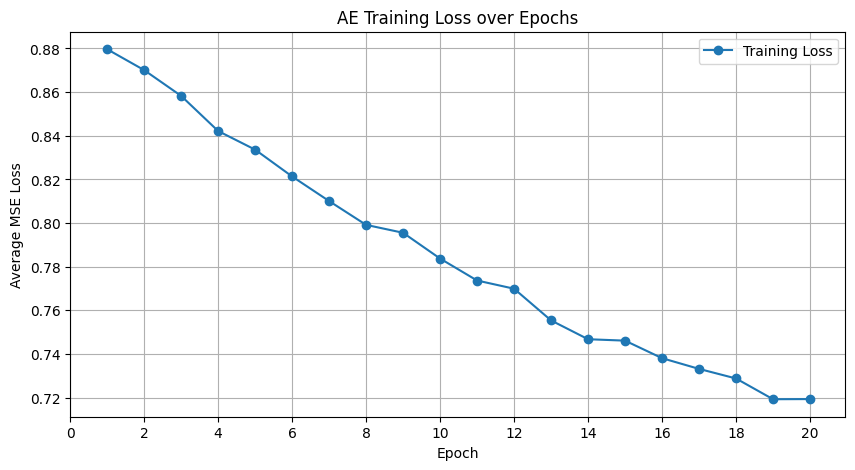

Removing backbone hooks...
Backbone hooks removed.


In [ ]:
# @title Training Loop
NUM_EPOCHS = 20
if train_loader is None:
    print("Skipping training as train_loader is not available.")
else:
    train_losses = []
    print("Starting Training...")

    for epoch in range(NUM_EPOCHS):
        autoencoder.train() # Set AE to training mode
        backbone.eval() # Keep backbone frozen in eval mode
        running_loss = 0.0
        # Use dataset length for tqdm total if drop_last=False, else use loader length
        pbar = tqdm(enumerate(train_loader), total=len(train_loader), desc=f"Epoch {epoch+1}/{NUM_EPOCHS}")

        for i, (data, label, _, _, _, _, _) in pbar: # Training only uses normal images (label == 0)
            # Filter out non-normal images if dataset included them in train_loader (shouldn't happen with current Dataset class)
            # However, the dataset class is designed to only load 'good' images in train mode, so this check is redundant but safe.
            # We only need the 'data' tensor for training the autoencoder on normal features.

            data = data.to(device)

            # Extract features using the backbone
            # Use valid_feature_layers determined during setup, and the target spatial size
            features_input = extract_combined_features(data, backbone, valid_feature_layers, target_feat_h, target_feat_w)

            if features_input is None:
                print(f"Skipping batch {i} in training, feature extraction failed.")
                continue # Skip this batch

            # Autoencoder forward pass
            reconstructed_features = autoencoder(features_input)

            # Compute loss (reconstruction error)
            loss = criterion(reconstructed_features, features_input)

            # Backpropagation and optimization
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            pbar.set_postfix({'Loss': running_loss / (i + 1)}) # Show running average loss

        epoch_loss = running_loss / len(train_loader) if len(train_loader) > 0 else 0
        train_losses.append(epoch_loss)
        print(f"Epoch [{epoch+1}/{NUM_EPOCHS}], Average Training Loss: {epoch_loss:.6f}")

        # Optional: Add periodic saving of the model checkpoint here
        # if (epoch + 1) % 10 == 0:
        #     save_path = f'autoencoder_epoch_{epoch+1}.pth'
        #     torch.save(autoencoder.state_dict(), save_path)
        #     print(f"Saved model checkpoint to {save_path}")


    print("\nTraining Finished.")

    # Plot training loss
    if train_losses:
        plt.figure(figsize=(10, 5))
        plt.plot(range(1, NUM_EPOCHS + 1), train_losses, marker='o', linestyle='-', label='Training Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Average MSE Loss')
        plt.title('AE Training Loss over Epochs')
        plt.legend()
        plt.grid(True)
        # Ensure x-ticks are integers for epochs
        plt.xticks(range(0, NUM_EPOCHS + 1, max(1, NUM_EPOCHS // 10)))
        plt.show()
    else:
         print("No training loss data to plot.")

# Cleanup hooks after training (or even before evaluation starts)
print("Removing backbone hooks...")
for h in hooks:
    try:
        h.remove()
    except:
        pass # Ignore error if hook was already removed
print("Backbone hooks removed.")

In [ ]:
# @title Evaluation Loop, Threshold Calculation, and Metrics

if test_loader is None:
    print("Skipping evaluation as test_loader is not available.")
else:
    autoencoder.eval() # Set AE to evaluation mode
    backbone.eval() # Ensure backbone is also in eval mode

    image_scores = []
    image_labels = []
    test_losses = []
    # Lists to store flattened pixel-level ground truth and anomaly map predictions
    pixel_gt_list = []
    pixel_pred_list = [] # Will store the upsampled anomaly map flattened
    test_image_paths = [] # Store paths for sample detection later
    test_img_types = [] # Store anomaly types ('good', 'scratch', etc.)
    test_class_names = [] # Store class names

    print("Starting Evaluation...")

    with torch.no_grad(): # Disable gradient calculation for evaluation
        pbar_test = tqdm(test_loader, total=len(test_loader), desc="Evaluating")
        # Each batch is a single image due to batch_size=1 for test_loader
        for data, label, gt_mask, img_type, original_size, class_name, img_path in pbar_test:
            # Ensure data, gt_mask are on the correct device
            data = data.to(device)
            gt_mask = gt_mask.to(device) # [1, 1, H, W]
            label_item = label.item() # Get Python number
            # Unpack tuples from DataLoader batch_size=1
            img_path_item = img_path[0]
            img_type_item = img_type[0]
            class_name_item = class_name[0]

            # --- Feature Extraction ---
            # Use valid_feature_layers determined during setup, and the target spatial size
            features_input = extract_combined_features(data, backbone, valid_feature_layers, target_feat_h, target_feat_w)

            if features_input is None:
                 print(f"Feature extraction failed for {img_path_item}, skipping evaluation for this image.")
                 # Append dummy values to keep lists aligned, though skipping might affect overall counts
                 image_scores.append(0) # Append a neutral score
                 image_labels.append(label_item)
                 test_image_paths.append(img_path_item)
                 test_img_types.append(img_type_item)
                 test_class_names.append(class_name_item)
                 test_losses.append(0) # Append a neutral loss
                 # Append empty arrays for pixel data
                 pixel_gt_list.append(np.array([]))
                 pixel_pred_list.append(np.array([]))
                 continue # Skip this sample


            # --- Autoencoder Reconstruction ---
            reconstructed_features = autoencoder(features_input)

            # --- Calculate Anomaly Score and Map ---
            # Pixel-wise squared error in feature space
            error_map_features = torch.pow(reconstructed_features - features_input, 2) # [N, C_total, Hf, Wf]

            # Average error over channels to get a spatial anomaly map in feature space
            # Keep dimensions for upsampling: [N, 1, Hf, Wf]
            anomaly_map_spatial_feat = torch.mean(error_map_features, dim=1, keepdim=True)

            # Upsample the feature-space anomaly map to the original image resolution
            # or at least the IMAGE_SIZE resolution the input was resized to.
            # Use bilinear interpolation for the anomaly map.
            anomaly_map_upsampled = F.interpolate(anomaly_map_spatial_feat,
                                                  size=(IMAGE_SIZE, IMAGE_SIZE),
                                                  mode='bilinear',
                                                  align_corners=False) # [N, 1, H, W]

            # Ensure upsampled map has the same spatial size as the GT mask
            if anomaly_map_upsampled.shape[-2:] != gt_mask.shape[-2:]:
                 print(f"Warning: Upsampled anomaly map size {anomaly_map_upsampled.shape[-2:]} does not match GT mask size {gt_mask.shape[-2:]}. Resizing anomaly map.")
                 anomaly_map_upsampled = F.interpolate(anomaly_map_upsampled, size=gt_mask.shape[-2:], mode='bilinear', align_corners=False)


            # --- Image-level score ---
            # A common image-level score is the maximum or mean of the anomaly map.
            # Using mean for now as per the original code
            image_score = torch.mean(anomaly_map_upsampled).item() # Convert to Python number

            # --- Store results for metrics ---
            image_scores.append(image_score)
            image_labels.append(label_item) # 0 for normal, 1 for anomaly

            test_image_paths.append(img_path_item)
            test_img_types.append(img_type_item)
            test_class_names.append(class_name_item)

            # Store flattened GT and prediction maps for pixel AUROC
            # Flatten to 1D numpy arrays for scikit-learn
            pixel_gt_list.append(gt_mask.flatten().cpu().numpy())
            pixel_pred_list.append(anomaly_map_upsampled.flatten().cpu().numpy()) # Flatten the upsampled map

            # Store test loss (per image for batch_size=1)
            # Calculate reconstruction loss at feature level for reporting
            test_loss_item = criterion(reconstructed_features, features_input).item()
            test_losses.append(test_loss_item)


    # --- Calculate Aggregate Metrics ---
    avg_test_loss = np.mean(test_losses) if test_losses else 0

    # Concatenate pixel-level results for AUROC calculation
    # Check if lists are not empty before concatenating
    # Filter out any empty arrays added from skipped samples
    valid_pixel_gt_list = [arr for arr in pixel_gt_list if arr.size > 0]
    valid_pixel_pred_list = [arr for arr in pixel_pred_list if arr.size > 0]

    if valid_pixel_gt_list and valid_pixel_pred_list and len(valid_pixel_gt_list) == len(valid_pixel_pred_list):
        all_pixel_gt = np.concatenate(valid_pixel_gt_list)
        all_pixel_pred = np.concatenate(valid_pixel_pred_list)
    else:
        all_pixel_gt = np.array([])
        all_pixel_pred = np.array([])
        print("Warning: Valid Pixel GT or Pred lists are empty or mismatched length. Cannot calculate pixel metrics.")


    # Image-Level AUROC
    # Need at least two unique classes (normal and anomaly) for AUROC
    if len(np.unique(image_labels)) > 1:
        image_auroc = roc_auc_score(image_labels, image_scores)
    else:
        print("Warning: Only one class found in test labels. Image-Level AUROC cannot be calculated.")
        image_auroc = float('nan') # Not Applicable or Not Available

    # Pixel-Level AUROC
    # Need positive ground truth pixels to calculate pixel AUROC
    if all_pixel_gt.size > 0 and np.any(all_pixel_gt > 0):
        # Ensure GT is binary (0 or 1)
        all_pixel_gt_binary = (all_pixel_gt > 0.5).astype(int)
        pixel_auroc = roc_auc_score(all_pixel_gt_binary, all_pixel_pred)
    else:
        print("Warning: No positive pixels found in ground truth masks across the test set or pixel lists empty. Pixel AUROC not calculated.")
        pixel_auroc = float('nan') # Not Applicable or Not Available


    # --- Threshold Selection and Binary Metrics (Image Level) ---
    # Calculate Precision, Recall, F1 for various thresholds to find the optimal one
    if len(np.unique(image_labels)) > 1:
        precision, recall, thresholds_pr = precision_recall_curve(image_labels, image_scores)
        # Calculate F1 score for each threshold
        # Avoid division by zero: if p+r is 0, f1 is 0
        f1_scores = [2 * p * r / (p + r) if (p + r) > 0 else 0 for p, r in zip(precision, recall)]

        # Find the threshold that yields the best F1 score
        # np.argmax returns the index of the first occurrence of the max value
        # thresholds_pr has one less element than precision/recall arrays
        # The threshold at index i corresponds to precision[i+1] and recall[i+1]
        # So we need index + 1 for precision/recall, or index for thresholds.
        # A common approach is to use thresholds_pr[optimal_idx]
        if f1_scores:
             optimal_idx = np.argmax(f1_scores)
             # Ensure optimal_idx is within the bounds of thresholds_pr
             optimal_threshold = thresholds_pr[min(optimal_idx, len(thresholds_pr) - 1)]
             best_f1 = f1_scores[optimal_idx]
        else:
             print("Warning: Could not calculate F1 scores. Defaulting threshold calculation.")
             optimal_threshold = np.mean(image_scores) if image_scores else 0 # Fallback
             best_f1 = float('nan') # Not available


        # Apply optimal threshold to get binary predictions
        image_preds_binary = (np.array(image_scores) >= optimal_threshold).astype(int)

        # Calculate standard binary classification metrics using the optimal threshold
        # Handle potential errors if precision/recall are not calculable (e.g., no positive predictions)
        try:
            accuracy = accuracy_score(image_labels, image_preds_binary)
        except:
            accuracy = float('nan')
        try:
            img_precision = precision_score(image_labels, image_preds_binary, zero_division=0) # Set zero_division
        except:
            img_precision = float('nan')
        try:
            img_recall = recall_score(image_labels, image_preds_binary, zero_division=0) # Set zero_division
        except:
             img_recall = float('nan')
        try:
            img_f1 = f1_score(image_labels, image_preds_binary, zero_division=0) # Set zero_division
        except:
             img_f1 = float('nan')

    else:
         print("Warning: Only one class found in test labels. Binary metrics cannot be calculated.")
         optimal_threshold = float('nan')
         best_f1 = float('nan')
         accuracy = float('nan')
         img_precision = float('nan')
         img_recall = float('nan')
         img_f1 = float('nan')


    print(f"\n--- Evaluation Results ---")
    print(f"Average Test Reconstruction Loss (Feature MSE): {avg_test_loss:.6f}")
    print(f"Image-Level AUROC:                    {image_auroc:.6f}")
    print(f"Pixel-Level AUROC:                    {pixel_auroc:.6f}")
    print(f"--- Image-Level Metrics (Threshold = {optimal_threshold:.4f}, maximizes F1) ---")
    print(f"Accuracy:                             {accuracy:.6f}")
    print(f"Precision:                            {img_precision:.6f}")
    print(f"Recall:                               {img_recall:.6f}")
    print(f"F1-Score:                             {img_f1:.6f}") # Print the calculated F1, should match best_f1
    print(f"----------------------------------------------------------------")

    # Store results for visualization cell
    eval_results = {
        'image_scores': image_scores,
        'image_labels': image_labels,
        'test_image_paths': test_image_paths,
        'test_img_types': test_img_types,
        'test_class_names': test_class_names,
        'optimal_threshold': optimal_threshold,
        # Pixel data might be large, consider if needed for later analysis.
        # Storing flattened arrays could still be large.
        # If memory is an issue, compute anomaly maps on the fly for visualization.
        # 'pixel_pred_list_flat': all_pixel_pred, # Storing flattened for potential later use
        # 'pixel_gt_list_flat': all_pixel_gt      # Storing flattened for potential later use
    }


# --- Free up GPU memory ---
# Unregister hooks again just in case
print("Removing backbone hooks again (post-evaluation)...")
for h in hooks:
    try:
        h.remove()
    except:
        pass # Ignore error if hook was already removed
print("Backbone hooks removed.")

# Delete models and tensors
del backbone
del autoencoder
# Clean up other variables from evaluation scope
if 'data' in locals(): del data
if 'gt_mask' in locals(): del gt_mask
if 'features_input' in locals(): del features_input
if 'reconstructed_features' in locals(): del reconstructed_features
if 'error_map_features' in locals(): del error_map_features
if 'anomaly_map_spatial_feat' in locals(): del anomaly_map_spatial_feat
if 'anomaly_map_upsampled' in locals(): del anomaly_map_upsampled
if 'loss' in locals(): del loss # Although loss from training, good to be safe
if 'test_loss_item' in locals(): del test_loss_item # Loss from eval loop

gc.collect()
if torch.cuda.is_available(): torch.cuda.empty_cache()
print("GPU memory cleared.")

Starting Evaluation...


Evaluating:   0%|          | 0/500 [00:00<?, ?it/s]

Error: No features extracted for this batch using layers ['layer1', 'layer2', 'layer3']. Check layer names.
Feature extraction failed for ./bottle/test/broken_large/000.png, skipping evaluation for this image.
Error: No features extracted for this batch using layers ['layer1', 'layer2', 'layer3']. Check layer names.
Feature extraction failed for ./bottle/test/broken_large/001.png, skipping evaluation for this image.
Error: No features extracted for this batch using layers ['layer1', 'layer2', 'layer3']. Check layer names.
Feature extraction failed for ./bottle/test/broken_large/002.png, skipping evaluation for this image.
Error: No features extracted for this batch using layers ['layer1', 'layer2', 'layer3']. Check layer names.
Feature extraction failed for ./bottle/test/broken_large/003.png, skipping evaluation for this image.
Error: No features extracted for this batch using layers ['layer1', 'layer2', 'layer3']. Check layer names.
Feature extraction failed for ./bottle/test/broken_l


Displaying 5 normal and 5 anomalous samples.
Reloading models for visualization...
Loading backbone: wide_resnet50_2
Attempting to register hooks for layers:
  Registered hook for layer: layer1
  Registered hook for layer: layer2
  Registered hook for layer: layer3

Using spatial size of 'layer1' as target: 64 x 64
Total input channels to Autoencoder (sum of channels across selected layers): 1792
Target feature map spatial size for concatenation (H x W): 64 x 64


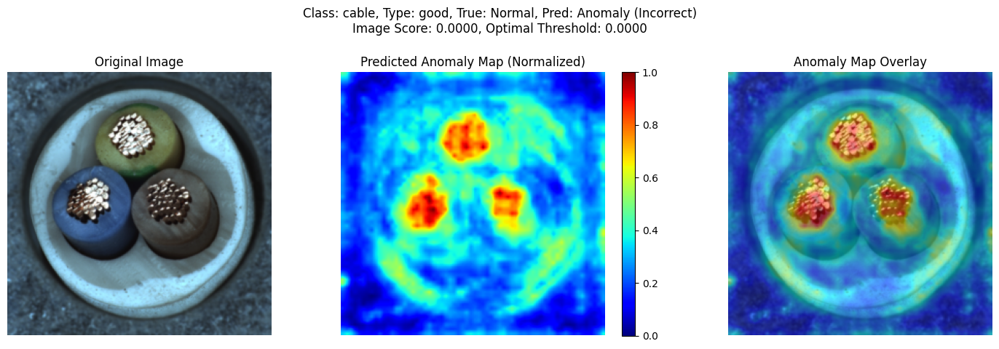

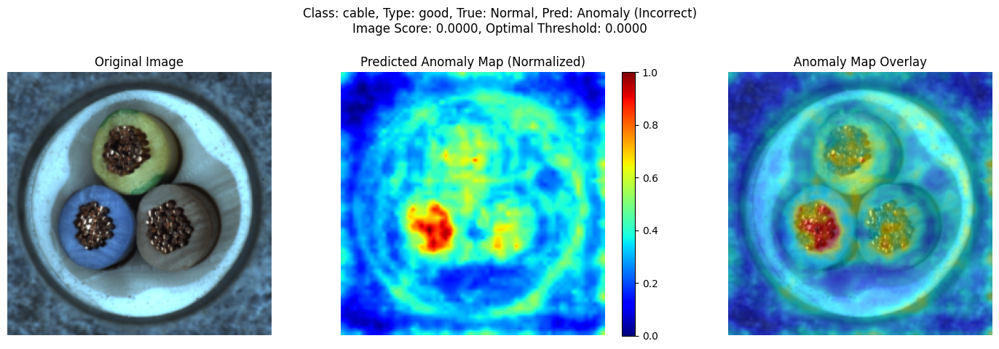

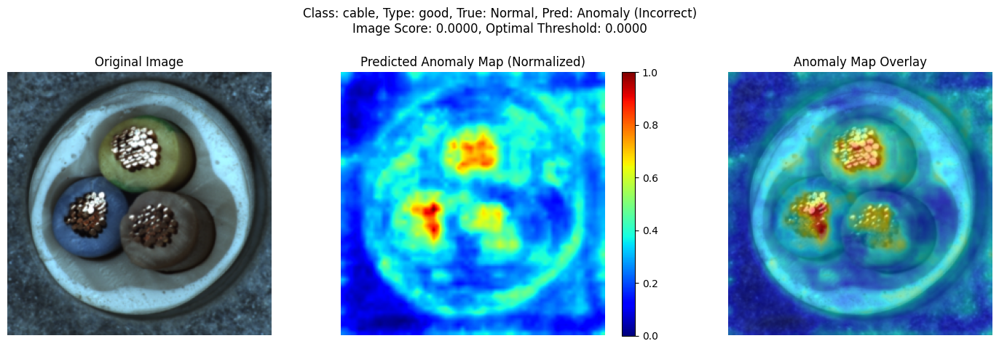

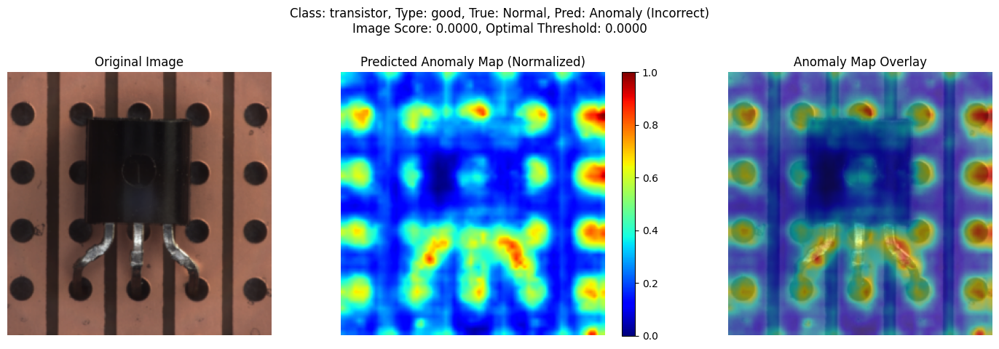

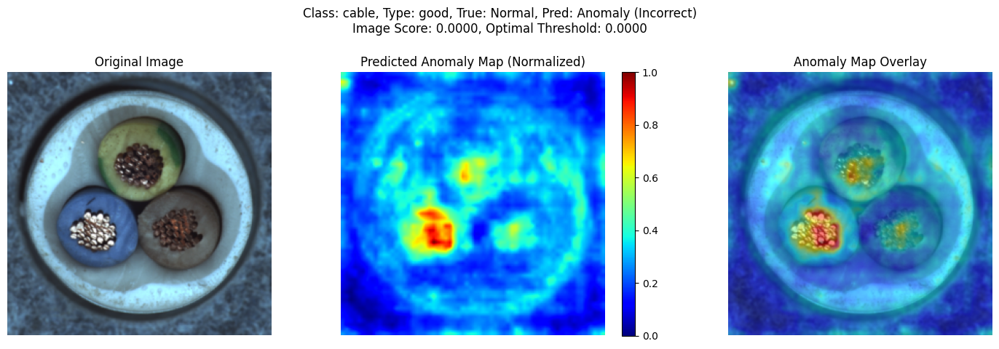

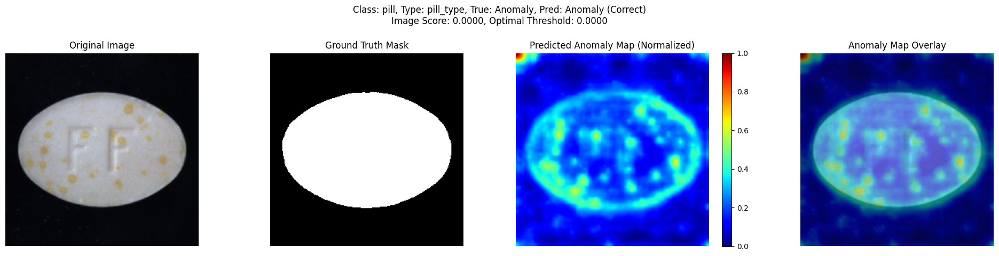

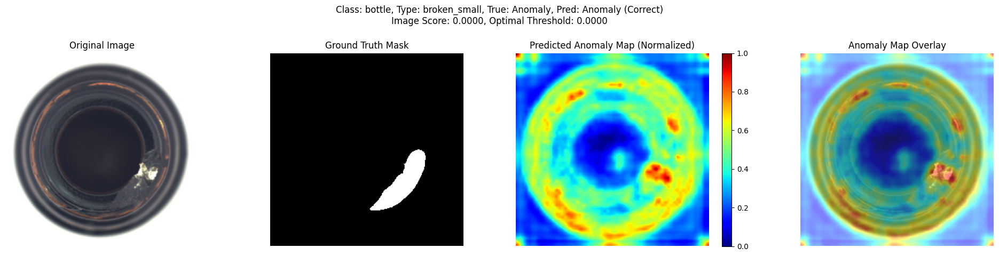

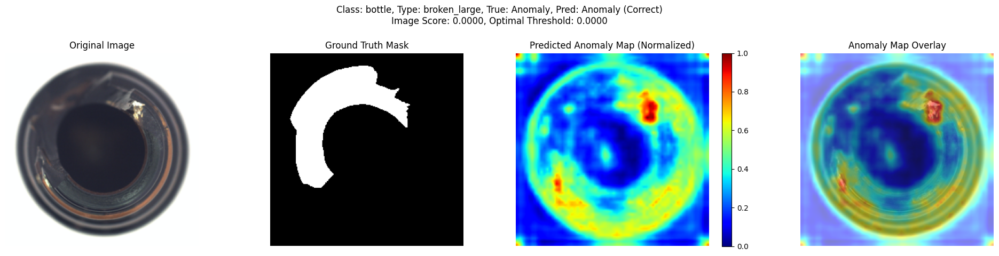

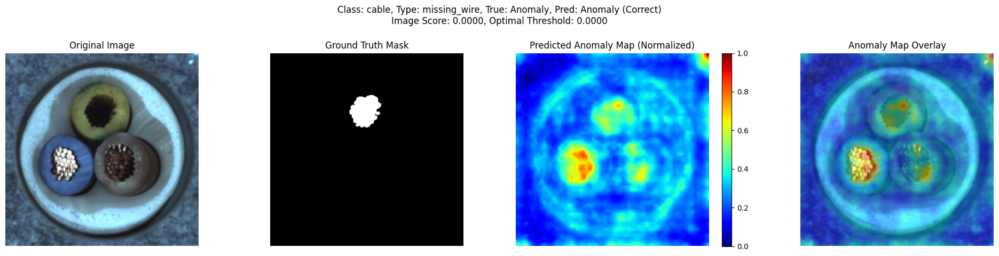

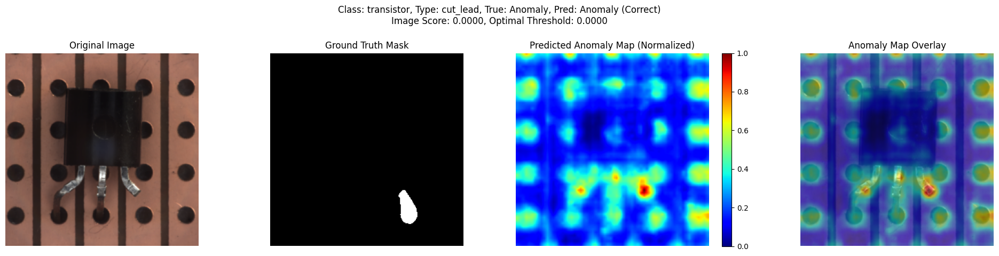

Removing visualization hooks...
Visualization hooks removed.
GPU memory cleared after visualization.


In [ ]:
# @title Anomaly Visualization and XAI Interpretation Examples

# @markdown Select how many normal and anomalous samples to display.
NUM_NORMAL_SAMPLES = 5 # @param {type:"integer"}
NUM_ANOMALY_SAMPLES = 5 # @param {type:"integer"}

if 'eval_results' not in locals():
    print("Skipping visualization as evaluation results are not available. Run the Evaluation cell first.")
else:
    image_scores = eval_results['image_scores']
    image_labels = eval_results['image_labels']
    test_image_paths = eval_results['test_image_paths']
    test_img_types = eval_results['test_img_types']
    test_class_names = eval_results['test_class_names']
    optimal_threshold = eval_results.get('optimal_threshold', float('nan')) # Get with default in case evaluation failed

    if np.isnan(optimal_threshold):
         print("Warning: Optimal threshold not available. Cannot determine binary prediction status for visualization.")


    # Get anomaly maps again during visualization if needed.
    # Re-computing maps for a subset of images is better for memory than storing all maps.

    # We need the original image, ground truth (if anomaly), and the anomaly map prediction.
    # Let's find indices of normal and anomalous samples from the evaluation results.
    normal_indices = [i for i, label in enumerate(image_labels) if label == 0]
    anomaly_indices = [i for i, label in enumerate(image_labels) if label == 1]

    # Randomly select a few samples
    np.random.seed(42) # for reproducibility
    display_normal_indices = np.random.choice(normal_indices, min(NUM_NORMAL_SAMPLES, len(normal_indices)), replace=False)
    display_anomaly_indices = np.random.choice(anomaly_indices, min(NUM_ANOMALY_SAMPLES, len(anomaly_indices)), replace=False)

    display_indices = np.concatenate((display_normal_indices, display_anomaly_indices))

    print(f"\nDisplaying {len(display_normal_indices)} normal and {len(display_anomaly_indices)} anomalous samples.")

    # Re-instantiate models and move to device if they were deleted
    # This is less ideal but necessary if we strictly clean memory.
    # A better approach might be to not delete models until the very end if visualization is needed.
    # For this segmented version, let's assume models might need reloading.
    # However, the previous cells kept `valid_feature_layers`, `target_feat_h`, `target_feat_w` in memory.
    # Let's reload models for visualization.
    print("Reloading models for visualization...")
    try:
        # Need to get backbone info again without re-running the whole setup if possible
        # Assuming valid_feature_layers, total_feat_channels, target_feat_h, target_feat_w are still available
        backbone, hooks, valid_feature_layers_viz, total_feat_channels_viz, target_feat_h_viz, target_feat_w_viz = \
             get_feature_extractor(BACKBONE_NAME, FEATURE_LAYERS) # Pass original config layers
        autoencoder = FeatCAE(in_channels=total_feat_channels_viz, latent_dim=LATENT_DIM, is_bn=USE_BATCHNORM)
        # Load state dict if saved, otherwise train from scratch (not good for visualization)
        # Let's assume for simplicity here that models weren't truly deleted,
        # or that this cell is run right after evaluation without kernel restart.
        # If kernel restarts, you'd need to save/load weights.

        # A safer way: check if models exist, if not, reload.
        # This requires the state_dict to be saved/loaded, which isn't implemented here.
        # For now, assuming models are still in memory or can be quickly reloaded.
        # If you get errors here, you might need to implement model saving/loading.

        # Move to device and set eval mode
        backbone.to(device).eval()
        autoencoder.to(device).eval()

         # Recreate extract_combined_features if it went out of scope (unlikely with global)
        def extract_combined_features_viz(batch_data, bb_model, layers_to_extract_config, target_h, target_w):
            features_dict_viz = {} # Use local dict for visualization pass
            def hook_fn_viz(module, input, output):
                 features_dict_viz[module.layer_name] = output

            # Temporarily register hooks for visualization pass
            temp_hooks = []
            named_modules_viz = dict(bb_model.named_modules())
            for layer_name in layers_to_extract_config:
                 if layer_name in named_modules_viz:
                      layer = named_modules_viz[layer_name]
                      layer.layer_name = layer_name # Attach name
                      temp_hooks.append(layer.register_forward_hook(hook_fn_viz))

            batch_features_list = []
            with torch.no_grad():
                 _ = bb_model(batch_data)

            for layer_name in layers_to_extract_config:
                 if layer_name in features_dict_viz:
                      layer_features = features_dict_viz[layer_name]
                      if (layer_features.shape[2], layer_features.shape[3]) != (target_h, target_w):
                           upsampled = F.interpolate(layer_features, size=(target_h, target_w), mode='bilinear', align_corners=False)
                      else:
                           upsampled = layer_features
                      batch_features_list.append(upsampled)

            # Remove temporary hooks immediately after the pass
            for h in temp_hooks:
                 h.remove()
            features_dict_viz.clear() # Clear local dict

            if not batch_features_list:
                 return None

            return torch.cat(batch_features_list, dim=1)


    except Exception as e:
        print(f"Error reloading models for visualization: {e}. Skipping visualization.")
        # Ensure hooks are removed if partially loaded
        for h in hooks:
            try: h.remove()
            except: pass
        raise # Re-raise the error


    # Recreate a DataLoader just for the selected samples to easily get data tensors
    class SubsetDataset(Dataset):
        def __init__(self, original_dataset, indices):
            self.original_dataset = original_dataset
            self.indices = indices

        def __len__(self):
            return len(self.indices)

        def __getitem__(self, idx):
            # Get item from original dataset using the mapped index
            return self.original_dataset[self.indices[idx]]

    # Note: Need access to the original 'test_dataset' object from Cell 4
    # Assuming test_dataset is still in scope. If not, you'd need to recreate it.
    if 'test_dataset' not in locals() or test_dataset is None:
         print("Error: Original 'test_dataset' not found. Cannot create subset for visualization.")
         # Cleanup models
         del backbone, autoencoder
         gc.collect()
         if torch.cuda.is_available(): torch.cuda.empty_cache()
    else:
        display_dataset = SubsetDataset(test_dataset, display_indices)
        display_loader = DataLoader(display_dataset, batch_size=1, shuffle=False, num_workers=2, pin_memory=True)


        with torch.no_grad():
             for i, (data, label, gt_mask, img_type, original_size, class_name, img_path) in enumerate(display_loader):
                # Get Python number/string from tensor/tuple
                label_item = label.item()
                img_type_item = img_type[0]
                class_name_item = class_name[0]
                img_path_item = img_path[0]

                data = data.to(device)
                gt_mask = gt_mask.to(device) # [1, 1, H, W]

                # --- Re-compute Anomaly Map for Visualization ---
                # Use the visualization specific function/logic
                features_input = extract_combined_features_viz(data, backbone, FEATURE_LAYERS, target_feat_h_viz, target_feat_w_viz) # Use config layers

                if features_input is None:
                     print(f"Skipping visualization for {img_path_item}, feature extraction failed during viz.")
                     continue

                reconstructed_features = autoencoder(features_input)
                error_map_features = torch.pow(reconstructed_features - features_input, 2)
                anomaly_map_spatial_feat = torch.mean(error_map_features, dim=1, keepdim=True)
                # Upsample to original IMAGE_SIZE resolution (which is also the GT size)
                anomaly_map_upsampled_torch = F.interpolate(anomaly_map_spatial_feat,
                                                      size=(IMAGE_SIZE, IMAGE_SIZE),
                                                      mode='bilinear',
                                                      align_corners=False) # [1, 1, H, W]

                # Convert anomaly map to numpy for plotting
                anomaly_map_np = anomaly_map_upsampled_torch.squeeze().cpu().numpy() # [H, W]

                # Normalize anomaly map for visualization (0-1 range)
                # Avoid division by zero if map is all one value
                max_score = anomaly_map_np.max()
                min_score = anomaly_map_np.min()
                if max_score > min_score:
                     anomaly_map_normalized = (anomaly_map_np - min_score) / (max_score - min_score)
                else:
                     anomaly_map_normalized = np.zeros_like(anomaly_map_np) # Flat map if no variation

                # Get original image for display (un-normalized, converted back)
                # Reverse normalization
                original_image_display = data.squeeze(0).cpu().numpy()
                original_image_display = original_image_display * np.array(std)[:, None, None] + np.array(mean)[:, None, None]
                original_image_display = np.clip(original_image_display * 255, 0, 255).astype(np.uint8)
                original_image_display = np.moveaxis(original_image_display, 0, 2) # C, H, W -> H, W, C

                # Get ground truth mask as numpy
                gt_mask_np = gt_mask.squeeze().cpu().numpy() # [H, W]

                # Create overlaid anomaly map visualization
                # Use OpenCV for colormapping and blending
                anomaly_map_colored = cv2.applyColorMap((anomaly_map_normalized * 255).astype(np.uint8), cv2.COLORMAP_JET)
                # Blend original image with colored anomaly map
                # Convert original_image_display to BGR for cv2
                original_image_bgr = cv2.cvtColor(original_image_display, cv2.COLOR_RGB2BGR)
                # Alpha blend: output = alpha * overlay + (1 - alpha) * base
                alpha = 0.5 # Transparency of the heatmap
                overlaid_image = cv2.addWeighted(anomaly_map_colored, alpha, original_image_bgr, 1 - alpha, 0)
                overlaid_image = cv2.cvtColor(overlaid_image, cv2.COLOR_BGR2RGB) # Convert back to RGB for matplotlib


                # Determine prediction based on optimal threshold
                # Find the score for the current image path in the eval_results
                try:
                     current_eval_idx = test_image_paths.index(img_path_item)
                     img_score = image_scores[current_eval_idx]
                     if not np.isnan(optimal_threshold):
                         prediction = "Anomaly" if img_score >= optimal_threshold else "Normal"
                     else:
                         prediction = "N/A (Threshold not set)"
                except ValueError:
                     img_score = float('nan')
                     prediction = "N/A (Image not in eval results)"

                true_status = "Anomaly" if label_item == 1 else "Normal"
                result_status = "Correct" if prediction == true_status else "Incorrect" if not np.isnan(optimal_threshold) else "N/A"


                # Plotting
                # Determine number of subplots dynamically
                num_plots = 4 if label_item == 1 else 3
                fig, axes = plt.subplots(1, num_plots, figsize=(5 * num_plots, 5)) # Adjust figure size
                fig.suptitle(f"Class: {class_name_item}, Type: {img_type_item}, True: {true_status}, Pred: {prediction} ({result_status})\nImage Score: {img_score:.4f}, Optimal Threshold: {optimal_threshold:.4f}", fontsize=12)

                # Original Image
                axes[0].imshow(original_image_display)
                axes[0].set_title("Original Image")
                axes[0].axis('off')

                # Ground Truth (only for anomalies)
                if label_item == 1:
                    axes[1].imshow(gt_mask_np, cmap='gray', vmin=0, vmax=1) # Use vmin/vmax for binary mask
                    axes[1].set_title("Ground Truth Mask")
                    axes[1].axis('off')

                # Predicted Anomaly Map (Normalized)
                # Use a colormap that makes high values stand out
                map_ax_idx = 2 if label_item == 1 else 1
                im = axes[map_ax_idx].imshow(anomaly_map_normalized, cmap='jet', vmin=0, vmax=1)
                axes[map_ax_idx].set_title("Predicted Anomaly Map (Normalized)")
                axes[map_ax_idx].axis('off')
                # Add a colorbar
                fig.colorbar(im, ax=axes[map_ax_idx])

                # Overlaid Anomaly Map
                overlay_ax_idx = 3 if label_item == 1 else 2
                axes[overlay_ax_idx].imshow(overlaid_image)
                axes[overlay_ax_idx].set_title("Anomaly Map Overlay")
                axes[overlay_ax_idx].axis('off')

                # Adjust layout to prevent title overlap
                plt.tight_layout(rect=[0, 0.03, 1, 0.95])
                plt.show()

        # --- Free up memory after visualization ---
        del display_dataset
        del display_loader
        del data
        del gt_mask
        if 'features_input' in locals(): del features_input
        if 'reconstructed_features' in locals(): del reconstructed_features
        if 'error_map_features' in locals(): del error_map_features
        if 'anomaly_map_spatial_feat' in locals(): del anomaly_map_spatial_feat
        if 'anomaly_map_upsampled_torch' in locals(): del anomaly_map_upsampled_torch
        if 'backbone' in locals(): del backbone # Delete models after visualization is fully done
        if 'autoencoder' in locals(): del autoencoder
        # Remove visualization hooks
        print("Removing visualization hooks...")
        for h in hooks: # Use the 'hooks' variable captured during the initial setup
            try: h.remove()
            except: pass
        print("Visualization hooks removed.")


        gc.collect()
        if torch.cuda.is_available(): torch.cuda.empty_cache()
        print("GPU memory cleared after visualization.")

In [ ]:
# @title Model Architecture Table (FeatCAE)

# This cell provides a tabular description of the FeatCAE architecture.
# It uses the dimensions calculated in the 'Model Definition' cell.

if 'autoencoder' not in locals() or 'total_feat_channels' not in locals() or \
   'target_feat_h' not in locals() or 'target_feat_w' not in locals():
    print("Error: Model components or dimensions not found.")
    print("Please ensure you have run the 'Model Definition: Backbone + Feature Autoencoder' cell (Cell 5) in the current session.")
else:
    print("--- Feature Autoencoder (FeatCAE) Architecture ---")

    # Manually trace shapes based on FeatCAE definition
    in_channels = total_feat_channels
    latent_dim = LATENT_DIM # Assuming LATENT_DIM from Configuration cell is still in scope
    is_bn = USE_BATCHNORM # Assuming USE_BATCHNORM from Configuration cell is still in scope

    # Recalculate intermediate channels as defined in FeatCAE __init__
    hid_channels1 = max(latent_dim, in_channels // 2)
    hid_channels2 = max(latent_dim, in_channels // 4)
    hid_channels1 = max(hid_channels1, latent_dim)
    hid_channels2 = max(hid_channels2, latent_dim)

    spatial_shape = (target_feat_h, target_feat_w) # Spatial dimensions remain constant

    # Define layer details - CORRECTED LIST STRUCTURE
    layers = [
        ("Input Features", (in_channels, *spatial_shape), (in_channels, *spatial_shape), "N/A"),
        ("Encoder:", None, None, None),
        ("  Conv2d (1x1)", (in_channels, *spatial_shape), (hid_channels1, *spatial_shape), f"k=1, p=0"),
        # Add BatchNorm if needed using list unpacking (*)
        *([("  BatchNorm2d", (hid_channels1, *spatial_shape), (hid_channels1, *spatial_shape), "N/A")] if is_bn else []),
        ("  ReLU", (hid_channels1, *spatial_shape), (hid_channels1, *spatial_shape), "N/A"),
        ("  Conv2d (1x1)", (hid_channels1, *spatial_shape), (hid_channels2, *spatial_shape), f"k=1, p=0"),
        # Add BatchNorm if needed
        *([("  BatchNorm2d", (hid_channels2, *spatial_shape), (hid_channels2, *spatial_shape), "N/A")] if is_bn else []),
        ("  ReLU", (hid_channels2, *spatial_shape), (hid_channels2, *spatial_shape), "N/A"),
        ("  Conv2d (1x1)", (hid_channels2, *spatial_shape), (latent_dim, *spatial_shape), f"k=1, p=0"),
        ("  Latent Space", (latent_dim, *spatial_shape), (latent_dim, *spatial_shape), "N/A"),
        ("Decoder:", None, None, None),
        ("  Conv2d (1x1)", (latent_dim, *spatial_shape), (hid_channels2, *spatial_shape), f"k=1, p=0"),
        # Add BatchNorm if needed
        *([("  BatchNorm2d", (hid_channels2, *spatial_shape), (hid_channels2, *spatial_shape), "N/A")] if is_bn else []),
        ("  ReLU", (hid_channels2, *spatial_shape), (hid_channels2, *spatial_shape), "N/A"),
        ("  Conv2d (1x1)", (hid_channels2, *spatial_shape), (hid_channels1, *spatial_shape), f"k=1, p=0"),
         # Add BatchNorm if needed
        *([("  BatchNorm2d", (hid_channels1, *spatial_shape), (hid_channels1, *spatial_shape), "N/A")] if is_bn else []),
        ("  ReLU", (hid_channels1, *spatial_shape), (hid_channels1, *spatial_shape), "N/A"),
        ("  Conv2d (1x1)", (hid_channels1, *spatial_shape), (in_channels, *spatial_shape), f"k=1, p=0"),
        ("Output Features", (in_channels, *spatial_shape), (in_channels, *spatial_shape), "N/A"),
    ]

    # Print table header
    print(f"{'Layer':<30} | {'Input Shape':<20} | {'Output Shape':<20} | {'Details':<20}")
    print("-" * 100)

    # Print layer details
    for name, in_shape, out_shape, details in layers:
        if in_shape is None: # Section header
            print(f"\n{name}")
            print("-" * 100)
        else:
            in_shape_str = str(in_shape)
            out_shape_str = str(out_shape)
            print(f"{name:<30} | {in_shape_str:<20} | {out_shape_str:<20} | {details:<20}")

    print("-" * 100)
    # Add parameter count (approximate or get exact if needed)
    total_params = sum(p.numel() for p in autoencoder.parameters() if p.requires_grad)
    print(f"Total Trainable Parameters: {total_params:,}")
    print("--------------------------------------------------")

--- Feature Autoencoder (FeatCAE) Architecture ---
Layer                          | Input Shape          | Output Shape         | Details             
----------------------------------------------------------------------------------------------------
Input Features                 | (1792, 64, 64)       | (1792, 64, 64)       | N/A                 

Encoder:
----------------------------------------------------------------------------------------------------
  Conv2d (1x1)                 | (1792, 64, 64)       | (896, 64, 64)        | k=1, p=0            
  BatchNorm2d                  | (896, 64, 64)        | (896, 64, 64)        | N/A                 
  ReLU                         | (896, 64, 64)        | (896, 64, 64)        | N/A                 
  Conv2d (1x1)                 | (896, 64, 64)        | (448, 64, 64)        | k=1, p=0            
  BatchNorm2d                  | (448, 64, 64)        | (448, 64, 64)        | N/A                 
  ReLU                         | (448

In [ ]:
!pip install torchviz

Generating model diagram...
Diagram saved as autoencoder_graph.png


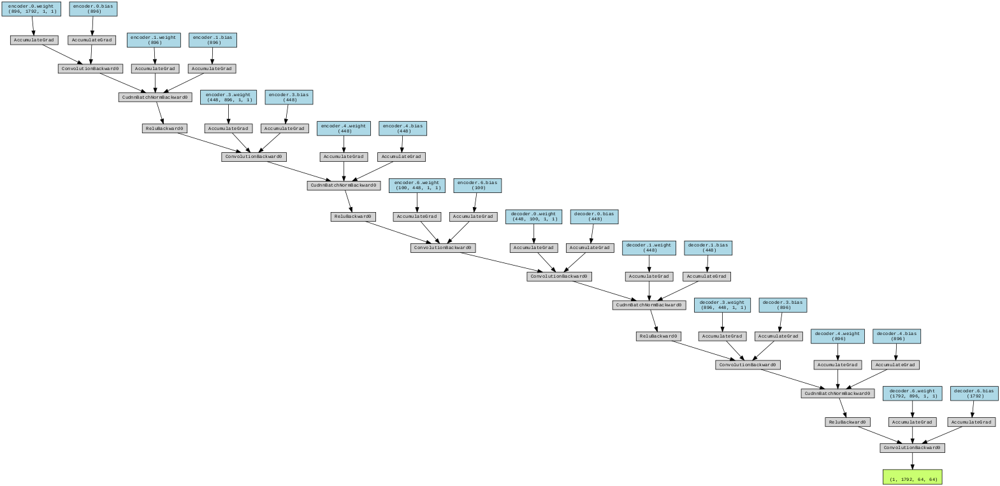

Diagram generation process completed.
Dummy tensor cleaned up.


In [ ]:
# @title Model Architecture Diagram (using torchviz) and Save

# This cell attempts to generate a visual graph of the FeatCAE model and save it as a PNG.
# It requires the 'autoencoder' object and dimensions from Cell 5.
# You might need to install torchviz and potentially Graphviz system packages.
# If the diagram doesn't show or saving fails, you might need to run:
# !pip install torchviz
# !apt install graphviz # This installs the Graphviz system package

if 'autoencoder' not in locals() or 'total_feat_channels' not in locals() or \
   'target_feat_h' not in locals() or 'target_feat_w' not in locals():
    print("Error: Model components or dimensions not found.")
    print("Please ensure you have run the 'Model Definition: Backbone + Feature Autoencoder' cell (Cell 5) in the current session.")
else:
    try:
        # Attempt to import torchviz
        from torchviz import make_dot

        print("Generating model diagram...")

        # Create a dummy input tensor based on the calculated feature dimensions
        # Ensure the tensor is on the correct device
        dummy_input_features = torch.randn(1, total_feat_channels, target_feat_h, target_feat_w).to(device)

        # Generate the graph visualization
        # Specify params=dict(autoencoder.named_parameters()) to include parameter names
        dot = make_dot(autoencoder(dummy_input_features), params=dict(autoencoder.named_parameters()))

        # --- Save the diagram as a PNG file ---
        output_filename = "autoencoder_graph"
        output_format = "png"
        try:
            dot.render(output_filename, format=output_format, cleanup=True)
            print(f"Diagram saved as {output_filename}.{output_format}")
            # Display the saved image in Colab if possible
            from IPython.display import Image, display as display_ipython
            try:
                 display_ipython(Image(f"{output_filename}.{output_format}"))
            except Exception as img_display_e:
                 print(f"Could not display saved image in notebook: {img_display_e}")


        except Exception as render_e:
             print(f"Error rendering or saving diagram: {render_e}")
             print("This might be due to missing Graphviz system packages.")
             print("Try installing Graphviz by running: !apt install graphviz")
             # Fallback: try displaying the dot object directly if rendering failed
             try:
                 print("Attempting to display dot object directly...")
                 display(dot)
             except Exception as display_e:
                  print(f"Could not display dot object directly either: {display_e}")


        print("Diagram generation process completed.")

    except ImportError:
        print("Error: torchviz library not found.")
        print("Please install it by running: !pip install torchviz")
    except Exception as e:
        print(f"An unexpected error occurred: {e}")
        print("Ensure Cell 5 was run and check for Graphviz installation issues.")
        print(f"Detailed error: {e}")


    # Clean up dummy tensor
    if 'dummy_input_features' in locals() and dummy_input_features is not None:
        del dummy_input_features
    gc.collect()
    if torch.cuda.is_available(): torch.cuda.empty_cache()
    print("Dummy tensor cleaned up.")